In [1]:
import pandas as pd
import zipfile
import os
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
import ast
import numpy as np
import seaborn as sns
from matplotlib.ticker import PercentFormatter
import matplotlib.ticker as mticker
import requests
import time
from wordcloud import WordCloud
from scipy import stats
from scipy.stats import kruskal, mannwhitneyu
from itertools import combinations
from statsmodels.stats.multitest import multipletests
import json
import nltk
from nltk.corpus import stopwords 
from nltk import word_tokenize
!pip install openpyxl
!pip install scikit-learn
!pip install statsmodels
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm


In [2]:
## preprocessing pipline put together
import os
import zipfile
import pickle
import re
import unicodedata
import pandas as pd
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk import pos_tag
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
import gc
import json
nltk.download('punkt_tab')
nltk.download('punkt', quiet=True)
nltk.download('averaged_perceptron_tagger', quiet=True)
nltk.download('averaged_perceptron_tagger_eng', quiet=True)
nltk.download('wordnet', quiet=True)
nltk.download('omw-1.4', quiet=True)

lemmatizer = WordNetLemmatizer()

# -------------------------
# Text Processing Functions
# -------------------------

def clean_text(text):
    text = unicodedata.normalize('NFKD', text)
    # Replace multiple whitespace characters with single space
    text = re.sub(r'\s+', ' ', text)
    # Replace non-breaking spaces with regular spaces
    text = re.sub(r'\u00a0', ' ', text)
    # Replace bullet points with hyphens
    text = re.sub(r'•', '-', text)
    return text.strip()

def fix_whitespaces(text):
    text = text.replace('\u00a0', ' ')
    # Collapse multiple spaces into single space
    text = re.sub(r'\s+', ' ', text)
    # Fix spacing between single letters and following words (e.g., "T arget" -> "Target")
    text = re.sub(r'\b([A-Za-z])\s+([A-Za-z]{1,})\b', r'\1\2', text)
    return text.strip()

def fix_hyphens(text):
    # Remove hyphens at line breaks (word continuation across lines)
    text = re.sub(r'-\s*\n\s*', '', text)
    # Replace newlines with spaces (except after periods)
    text = re.sub(r'(?<!\.)\n+', ' ', text)
    return text

def fix_spacing_errors(text):
    text = text.replace("’", "'")   #fix special apostrohes
    text = text.replace("‘", "'")   
    text = text.replace("“", '"')   
    text = text.replace("”", '"')
    # Add space after articles when followed by capital letter (e.g., "theCompany" -> "the Company")
    text = re.sub(r'\b(a|an|the)(?=[A-Z])', r'\1 ', text)
    # Add space after possessive 's when followed by letter (e.g., "company'sRevenue" -> "company's Revenue")
    text = re.sub(r"('s)([A-Za-z])", r"\1 \2", text)
    # Add space after "10-K" when followed by letter
    text = re.sub(r"(10-K)([a-zA-Z])", r"\1 \2", text)
    # Add space between lowercase and uppercase letters (camelCase splitting)
    text = re.sub(r"([a-z])([A-Z])", r"\1 \2", text)
    # Fix articles followed by capitalized words without space
    text = re.sub(r'\b(a|an|the)([A-Z][a-z]+)', r'\1 \2', text)
    # Remove numbers followed by spaces before capital letters
    text = re.sub(r'\b\d+\s+(?=[A-Z])', '', text)
    return text

def clean_item1a_riskfactors(text):
    # Removes variants at the beginnign of the tex like PART I / PARTI / ITEM 1A / 1.A.
    text = re.sub(r'^\s*(PART\s*I\s*)?ITEM\s*1\.?\s*A\.?', '', text, flags=re.IGNORECASE)
    # Removes "RISK FACTORS" or "FACTORS" at beginning
    text = re.sub(r'^\s*(RISK\s+FACTORS?|FACTORS?)\.?', '', text, flags=re.IGNORECASE)

    return text.strip()

def count_words(text):
    if not isinstance(text, str) or text.strip() == "":
        return 0
    tokens = word_tokenize(text)
    words = [word for word in tokens if word.isalpha()]
    return len(words)

# -------------------------
# Lemmatization Functions
# -------------------------

def _nltk_pos_to_wordnet(nltk_pos):
    """
    Converting the Parts of Speech tagging into WordNet constants,
    which is required by the lemmatizer and because of the difference how NLTK
    and lemmatizer use POS tagging
    """
    if nltk_pos.startswith('J'): #adjective
        return wordnet.ADJ
    if nltk_pos.startswith('V'): #verbs
        return wordnet.VERB
    if nltk_pos.startswith('N'):
        return wordnet.NOUN
    if nltk_pos.startswith('R'):
        return wordnet.ADV
    return wordnet.NOUN #fallback to noun

def lemmatize_sentence(s: str):
    """
    Function converts a sentence to word tokens, obtains the POS Tags to determine gramatical
    role of every word, lowercaseses and
    then lemmatizes according to the normalized form such as emissions --> emission
    """
    tokens = word_tokenize(s)
    pos_tags = pos_tag(tokens)
    return [lemmatizer.lemmatize(tok.lower(), _nltk_pos_to_wordnet(pos))
            for tok, pos in pos_tags]

def preprocess_keywords(climate_dict):
    """
    Takes the words from the climtate dictionary, normalizes the keywords to prepare for
    n-gram matching, tags the POS
    and lemmatizes each token and stores the lemma in the kw mapping, preparing
    a lemmatized set of keywords for matching
    """
    # 
    max_len = 1
    kw_map = {}
    for kw in climate_dict:
        # normalizing, remove special denotations
        kw_norm = kw.lower().replace('-', ' ').replace('/', ' ')
        kw_norm = re.sub(r'\s+', ' ', kw_norm).strip()
        # same tokenization, POS, lemmatization process
        kw_tokens = word_tokenize(kw_norm)
        kw_pos = pos_tag(kw_tokens)
        kw_lemmas = [lemmatizer.lemmatize(t, _nltk_pos_to_wordnet(p)) for t, p in kw_pos]
        #store as tuple for llookup
        kw_tuple = tuple(kw_lemmas)
        #map back to original
        kw_map[kw_tuple] = kw
        #track longest keyword for max n-gram limits
        if len(kw_tuple) > max_len:
            max_len = len(kw_tuple)
    return kw_map, max_len


# -------------------------
# Climate Dictionary Setup
# -------------------------

climate_dict = [
    # Core climate terms
    "climate change", "global warming", "greenhouse gas", "carbon dioxide",
    "extreme weather", "climate risk", "climate regulation", "climate legislation",
    "weather pattern", "temperature", "warming", "CO2", "emission", "methane", 
    "natural disaster", "drought", "flood", "wildfire", "hurricane", 
    "storm", "earthquake", "tsunami", "GHG",
    
    # Policy and regulatory
    "cap and trade", "clean air act", "kyoto protocol", "EU ETS",
    "climate initiative", "environmental regulation", "carbon tax",
    "renewable energy", "sustainability", "changing climate",
    "climate challenge", "climate condition", "climate control",
    "climate registry", "climate statute", "climate treaty",
    "climate-related initiative", "emission initiative", "emission standard",
    "greenhouse gas emissions legislation", "indirect effect",
    "indirect regulatory risk", "physical risk from climate change",
    "regulation related to climate change", "regulatory risk from climate change",
    "reduction of emission", "tailoring rule", "title v",
    "united nations framework convention on climate change",
    
    # Weather and environmental
    "cooler than normal summer", "extreme temperature", "rising temperature",
    "sea level", "unreasonably warm weather", "unusual weather",
    "volatility in seasonal temperature", "warm weather",
    "warmer than normal winter", "warmer weather", "warming of the climate",
    "weather concern", "environment", "ESG"
]

## Setup lemmatized approach
# 1. use regex to prefilter climate related words
pattern = re.compile(
    r"\b(" + "|".join(re.escape(w) for w in climate_dict) + r")\b",
    flags=re.IGNORECASE)
# 2. second step if case from regex detected, use the lemmatization appraoch for keyword matching
kw_map, max_kw_len = preprocess_keywords(climate_dict)
kw_lemma_set = set(kw_map.keys())

def is_climate_sentence(sentence):
    """
    Inputs a sentence which was prefiltered by the regex,
    Uses the fast pattern check and lemmatizes the matches. Checks if n-gram
    equaös a keyword lemma tuple in the set
    """
    if not pattern.search(sentence):
        return False
    lemmas = lemmatize_sentence(sentence)
    n = len(lemmas)
    # n-gram generation and matching
    # go through every n gram sizes and use sliding window for the sentence
    for L in range(1, max_kw_len + 1):
        for i in range(n - L + 1):
            ng = tuple(lemmas[i:i+L])
            if ng in kw_lemma_set: # set lookup
                return True
    return False

def find_climate_sentences(sents: list[str], keywords: list[str] = None) -> list[str]:
    """
    Loops through a list of sentences and gives back the these for which is climate sentecne,
     uses is_climate_sentence to filter matches. Returns: List of sentences which are connected
     to climate 
    """
    matches = []
    for s in sents:
        if is_climate_sentence(s):
            matches.append(s)
    return matches

def find_climate_words(sents: list[str], keywords: list[str] = None) -> list[str]:
    """
    Finds matching sentences via regex and collects keyword which are part of the keyword
    mapping. Returns these original keywords not lemmas. 
    """
    found = set()
    for s in sents:
        if pattern.search(s):
            lemmas = lemmatize_sentence(s)
            n = len(lemmas)
            # n-gram matching with sliding window of a sentence
            for L in range(1, max_kw_len + 1):
                for i in range(n - L + 1):
                    ng = tuple(lemmas[i:i+L])
                    if ng in kw_lemma_set:
                        found.add(kw_map[ng].lower())
    return sorted(found)

# -------------------------
# Main Dataframe Processing Pipeline
# -------------------------

def process_dataframe(df):
    """Process a single dataframe through the entire pipeline"""
    
    # Text cleaning pipeline
    df["section_1A_clean"] = (
        df["section_1A"]
        .apply(lambda x: " ".join(x) if isinstance(x, list) else str(x))
        .apply(clean_text)
        .apply(fix_whitespaces)
        .apply(fix_hyphens)
        .apply(fix_spacing_errors)
        .apply(clean_item1a_riskfactors))
    
    # Sentence tokenization
    df["sentences"] = df["section_1A_clean"].apply(sent_tokenize)
    df["sentence_count"] = df["sentences"].apply(len)
    
    # Word counting
    df["word_count"] = df["section_1A_clean"].apply(count_words)
    
    # Climate analysis
    df["climate_sentences"] = df["sentences"].apply(lambda sents: find_climate_sentences(sents))
    
    df["climate_words"] = df["sentences"].apply(lambda sents: find_climate_words(sents))

    # convert to json to avoid list problems later in the analysis
    df["sentences_json"] = df["sentences"].apply(json.dumps)
    df["climate_sentences_json"] = df["climate_sentences"].apply(json.dumps)
    df["climate_words_json"] = df["climate_words"].apply(json.dumps)
    
    # Calculate count columns
    df["climate_sentences_count"] = df["climate_sentences"].apply(len)
    df["climate_words_count"] = df["climate_words"].apply(len)
    # Claclate normalized Ratio of climate related sentences in proportion of all sentences in a filing
    df["climate_ratio"] = df.apply(
        lambda row: len(row["climate_sentences"]) / len(row["sentences"]) if row["sentences"] else 0,
        axis=1)
    
    return df

# -------------------------
# File Processing Loop
# -------------------------

# Paths
zip_path = "section_1A.zip"
extract_to = "section_1A_extracted"
base_dir = os.path.join(extract_to, "section_1A")

# Unzip only if needed
if not os.path.exists(base_dir):
    with zipfile.ZipFile(zip_path, "r") as zf:
        zf.extractall(extract_to)

out_dir = "preprocessed_s&p_csvs"
os.makedirs(out_dir, exist_ok=True)

# Process files one-by-one
csv_files = []
pickle_files = [f for f in os.listdir(base_dir) if f.endswith('.pickle')]

# iterate over pickle files
for fname in pickle_files:
    ticker = os.path.splitext(fname)[0]
    print(f"Processing {ticker}...")

    # Load pickle
    with open(os.path.join(base_dir, fname), 'rb') as f:
        df = pickle.load(f)
    
    print(f"Loaded DataFrame with shape: {df.shape}")
    
    # Process through pipeline
    df = process_dataframe(df)
    
    # drop heavy memory consuming not needed columns
    columns_to_drop = ["section_1A", "section_1A_clean", "sentences", "climate_sentences", "climate_words"]
    df.drop(columns=columns_to_drop, inplace=True, errors='ignore')
    
    # Save to CSV
    out_name = os.path.join(out_dir, f"{ticker}.csv")
    df.to_csv(out_name, index=False)
    csv_files.append(out_name)

    print(f"Saved {out_name}")

    # Clean up memory
    del df
    gc.collect()
    nltk.data.clear_cache()

# -------------------------
# Zip all CSVs
# -------------------------
zip_out = "preprocessed_s&p_csv.zip"
with zipfile.ZipFile(zip_out, mode="w", compression=zipfile.ZIP_DEFLATED) as zf:
    for file in csv_files:
        zf.write(file, os.path.basename(file))  # Only store filename in zip
        os.remove(file)  # Remove individual CSV after adding to zip

os.rmdir(out_dir)  # Remove empty directory
print(f"All CSV files have been packaged into '{zip_out}'")
print(f"Processed {len(csv_files)} files.")

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\rober\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


Processing A...
Loaded DataFrame with shape: (20, 4)
Saved preprocessed_s&p_csvs\A.csv
Processing AAPL...
Loaded DataFrame with shape: (19, 4)
Saved preprocessed_s&p_csvs\AAPL.csv
Processing ABT...
Loaded DataFrame with shape: (20, 4)
Saved preprocessed_s&p_csvs\ABT.csv
Processing ADBE...
Loaded DataFrame with shape: (20, 4)
Saved preprocessed_s&p_csvs\ADBE.csv
Processing ADI...
Loaded DataFrame with shape: (19, 4)
Saved preprocessed_s&p_csvs\ADI.csv
Processing ADM...
Loaded DataFrame with shape: (19, 4)
Saved preprocessed_s&p_csvs\ADM.csv
Processing ADP...
Loaded DataFrame with shape: (20, 4)
Saved preprocessed_s&p_csvs\ADP.csv
Processing ADSK...
Loaded DataFrame with shape: (20, 4)
Saved preprocessed_s&p_csvs\ADSK.csv
Processing AEE...
Loaded DataFrame with shape: (20, 4)
Saved preprocessed_s&p_csvs\AEE.csv
Processing AEP...
Loaded DataFrame with shape: (15, 4)
Saved preprocessed_s&p_csvs\AEP.csv
Processing AES...
Loaded DataFrame with shape: (20, 4)
Saved preprocessed_s&p_csvs\AES.c

In [3]:
## Plot instruction
sns.set_style("whitegrid")

#### Load Data

In [4]:
## Load the data
def load_all_processed_data(zip_file_path):
    """
    Load all processed CSV files from zip and combine them
    """
    all_data = []
    
    with zipfile.ZipFile(zip_file_path, 'r') as zf:
        for file_name in zf.namelist():
            if file_name.endswith('.csv'):
                # Read CSV from zip

                ticker = os.path.splitext(file_name)[0]
                with zf.open(file_name) as f:
                    df = pd.read_csv(f)
                    df['ticker'] = ticker
                    
                    # Convert JSON strings back to lists
                    df['sentences'] = df['sentences_json'].apply(json.loads)
                    df.drop('sentences_json', axis=1, inplace=True)
                    
                    
                    df['climate_sentences'] = df['climate_sentences_json'].apply(json.loads)
                    df.drop('climate_sentences_json', axis=1, inplace=True)
                    
                    
                    df['climate_words'] = df['climate_words_json'].apply(json.loads)
                    df.drop('climate_words_json', axis=1, inplace=True)
                    
                    all_data.append(df)
    
    # Combine all dataframes
    combined_df = pd.concat(all_data, ignore_index=True)
    return combined_df

In [5]:
# import data from the zip file and use function to build the dataframe
zip_path = "preprocessed_s&p_csv.zip"
data = load_all_processed_data(zip_path)

In [6]:
## 1. replace "GHG" through "greenhouse gas" in climate_dict
climate_dict = ["greenhouse gas" if x.upper() == "GHG" else x for x in climate_dict]

# Prepare data: convert string lists to actual lists
data["climate_words_list"] = data["climate_words"].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

# Replace "GHG" in the actual filings too
def replace_ghg(word_list):
    return ["greenhouse gas" if w.upper() == "GHG" else w for w in word_list]

data["climate_words_list"] = data["climate_words_list"].apply(replace_ghg)

# prepare data
# data["climate_words_list"] = data["climate_words"].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

#flatten list to one string
all_words = [w for sublist in data["climate_words_list"] for w in sublist]

# count frequencies
word_counts = Counter(all_words)
# Top 50
top_50 = word_counts.most_common(50)

print("Top 50 climate words:")
for word, count in top_50:
    print(f"{word}: {count}")

# check words which are found of the climate dictionary
climate_dict_set = set(climate_dict)
found_words = sorted(climate_dict_set.intersection(all_words))
# amaount of retrieved words
found_count = len(found_words)

# Total words in dict
total_dict = len(climate_dict_set)

# Percent
percentage = found_count / total_dict * 100

print(f"{found_count}/{total_dict} ({percentage:.1f}%) climate dict words found in filings")


print(f"{len(found_words)} words from the climate dict were found:")
print(found_words)


Top 50 climate words:
environment: 3211
climate change: 1915
greenhouse gas: 1506
emission: 1405
natural disaster: 1182
extreme weather: 851
earthquake: 795
hurricane: 729
flood: 692
sustainability: 647
storm: 588
temperature: 557
drought: 488
carbon dioxide: 381
renewable energy: 367
environmental regulation: 360
sea level: 355
weather pattern: 319
esg: 304
wildfire: 286
clean air act: 193
tsunami: 179
global warming: 179
methane: 164
emission standard: 119
climate condition: 118
cap and trade: 113
carbon tax: 105
changing climate: 103
regulation related to climate change: 99
climate risk: 77
warming: 76
unusual weather: 62
united nations framework convention on climate change: 58
climate legislation: 44
physical risk from climate change: 44
rising temperature: 35
indirect effect: 33
extreme temperature: 32
kyoto protocol: 31
tailoring rule: 26
co2: 21
warm weather: 17
climate initiative: 15
eu ets: 12
warmer weather: 10
reduction of emission: 8
climate regulation: 5
climate control: 

##### 1. Exploratory Data Analyis

##### 1.1. Data Inspection and Cleaning

In [7]:
# quick check
data

,cik,FiscalYearEnd,URL,sentence_count,word_count,climate_sentences_count,climate_words_count,climate_ratio,ticker,sentences,climate_sentences,climate_words,climate_words_list
0,1090872,2024-10-31 00:00:00,https://www.sec.gov/Archives/edgar/data/109087...,304,9063,13,8,0.042763,A,[Business and Strategic Risks General economic...,"[Also, in such an environment, pricing pressur...","[climate change, drought, earthquake, environm...","[climate change, drought, earthquake, environm..."
1,1090872,2023-10-31 00:00:00,https://www.sec.gov/Archives/edgar/data/109087...,295,8662,11,8,0.037288,A,[Business and Strategic Risks General economic...,"[Also, in such an environment, pricing pressur...","[climate change, drought, earthquake, environm...","[climate change, drought, earthquake, environm..."
2,1090872,2022-10-31 00:00:00,https://www.sec.gov/Archives/edgar/data/109087...,291,8548,8,8,0.027491,A,[Business and Strategic Risks The COVID-19 pan...,"[As COVID-19 conditions have improved, the dur...","[climate change, drought, earthquake, environm...","[climate change, drought, earthquake, environm..."
3,1090872,2021-10-31 00:00:00,https://www.sec.gov/Archives/edgar/data/109087...,300,8792,7,6,0.023333,A,[Business and Strategic Risks The COVID-19 pan...,"[To the extent COVID-19 conditions improve, th...","[climate change, earthquake, environment, extr...","[climate change, earthquake, environment, extr..."
4,1090872,2020-10-31 00:00:00,https://www.sec.gov/Archives/edgar/data/109087...,298,8636,7,6,0.023490,A,"[Risks, Uncertainties and Other Factors Specif...","[To the extent COVID-19 conditions improve, th...","[climate change, earthquake, environment, extr...","[climate change, earthquake, environment, extr..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3891,1136869,2009-12-31 00:00:00,https://www.sec.gov/Archives/edgar/data/113686...,117,3511,1,1,0.008547,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment]
3892,1136869,2008-12-31 00:00:00,https://www.sec.gov/Archives/edgar/data/113686...,134,4048,1,1,0.007463,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment]
3893,1136869,2007-12-31 00:00:00,https://www.sec.gov/Archives/edgar/data/113686...,178,5109,1,1,0.005618,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment]
3894,1136869,2006-12-31 00:00:00,https://www.sec.gov/Archives/edgar/data/113686...,161,4618,1,1,0.006211,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment]


Years in the dataset: 2005 - 2024
Years: 20

Amount of observations per year:
FiscalYearEnd
2005    134
2006    194
2007    194
2008    196
2009    199
2010    201
2011    204
2012    203
2013    202
2014    197
2015    202
2016    209
2017    206
2018    206
2019    205
2020    175
2021    183
2022    187
2023    185
2024    186
Name: count, dtype: int64


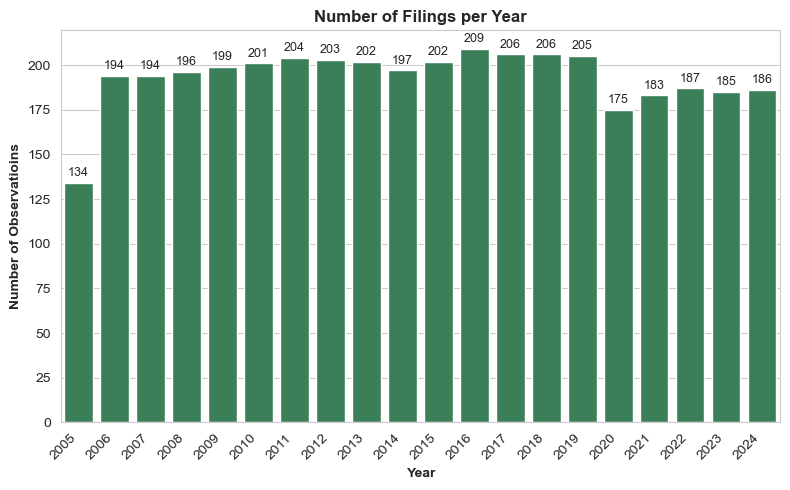

In [8]:
# 1. Clean columns not used in analysis, change year datatype

# remove URL columns
data = data.drop(columns={"URL"})
# remove rows which do not have counted any sentences due to no input from scraping
# data = data[data["sentence_count"]>0].copy()

## change column to year only which is int
data["FiscalYearEnd"] = pd.to_datetime(data["FiscalYearEnd"]).dt.year
# exclude 2025 filings for time series analysis
data = data[data["FiscalYearEnd"]!= 2025]


# check years
print(f"Years in the dataset: {data["FiscalYearEnd"].min()} - {data["FiscalYearEnd"].max()}")
print(f"Years: {data["FiscalYearEnd"].nunique()}")
print("\nAmount of observations per year:")
year_counts = data["FiscalYearEnd"].value_counts().sort_index()
print(year_counts)

## 2. Visualizing observations per year
palette=sns.set_palette("Greens", n_colors=len(year_counts))

# Plot Histogramm
plt.figure(figsize=(8, 5))
sns.barplot(x=year_counts.index, y=year_counts.values, color="seagreen")
plt.xticks(rotation=45, ha='right')
plt.xlabel('Year', fontweight="semibold")
plt.ylabel('Number of Observatioins',fontweight="semibold")
plt.title('Number of Filings per Year', fontweight="bold")

# Plot Values above bars
for i, v in enumerate(year_counts.values):
    plt.text(i, v + max(year_counts.values)*0.01, str(int(v)), ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.savefig("Amount of retrieved filings per sector.png", bbox_inches="tight")
plt.show()

In [9]:
## 3. check for null/NA values in the dataset
print("----- Check Dataframe for NAN values -----")
print(data.info())
data.isnull()
data.isna()

----- Check Dataframe for NAN values -----
<class 'pandas.core.frame.DataFrame'>
Index: 3868 entries, 0 to 3895
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   cik                      3868 non-null   int64  
 1   FiscalYearEnd            3868 non-null   int32  
 2   sentence_count           3868 non-null   int64  
 3   word_count               3868 non-null   int64  
 4   climate_sentences_count  3868 non-null   int64  
 5   climate_words_count      3868 non-null   int64  
 6   climate_ratio            3868 non-null   float64
 7   ticker                   3868 non-null   object 
 8   sentences                3868 non-null   object 
 9   climate_sentences        3868 non-null   object 
 10  climate_words            3868 non-null   object 
 11  climate_words_list       3868 non-null   object 
dtypes: float64(1), int32(1), int64(5), object(5)
memory usage: 377.7+ KB
None


,cik,FiscalYearEnd,sentence_count,word_count,climate_sentences_count,climate_words_count,climate_ratio,ticker,sentences,climate_sentences,climate_words,climate_words_list
0,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
3891,False,False,False,False,False,False,False,False,False,False,False,False
3892,False,False,False,False,False,False,False,False,False,False,False,False
3893,False,False,False,False,False,False,False,False,False,False,False,False
3894,False,False,False,False,False,False,False,False,False,False,False,False


##### 1.2. Load Sector Data

In [10]:
## 1. Load sector data and join to dataframe

# Access table with sector mappings of S&P500
url = "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies"
headers = {"User-Agent": "Mozilla/5.0"}

# request access
resp = requests.get(url, headers=headers, timeout=15)
resp.raise_for_status()

# create dataframe
sp500_df = pd.read_html(resp.text, header=0)[0]
sp500_df.head(10)

# Map the sectors to the tickers in the original dataframe
sector_map = dict(zip(sp500_df['Symbol'], sp500_df['GICS Sector']))
data['sector'] = data['ticker'].map(sector_map)
data

C:\Users\rober\AppData\Local\Temp\ipykernel_11432\404323000.py:12: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  sp500_df = pd.read_html(resp.text, header=0)[0]


,cik,FiscalYearEnd,sentence_count,word_count,climate_sentences_count,climate_words_count,climate_ratio,ticker,sentences,climate_sentences,climate_words,climate_words_list,sector
0,1090872,2024,304,9063,13,8,0.042763,A,[Business and Strategic Risks General economic...,"[Also, in such an environment, pricing pressur...","[climate change, drought, earthquake, environm...","[climate change, drought, earthquake, environm...",Health Care
1,1090872,2023,295,8662,11,8,0.037288,A,[Business and Strategic Risks General economic...,"[Also, in such an environment, pricing pressur...","[climate change, drought, earthquake, environm...","[climate change, drought, earthquake, environm...",Health Care
2,1090872,2022,291,8548,8,8,0.027491,A,[Business and Strategic Risks The COVID-19 pan...,"[As COVID-19 conditions have improved, the dur...","[climate change, drought, earthquake, environm...","[climate change, drought, earthquake, environm...",Health Care
3,1090872,2021,300,8792,7,6,0.023333,A,[Business and Strategic Risks The COVID-19 pan...,"[To the extent COVID-19 conditions improve, th...","[climate change, earthquake, environment, extr...","[climate change, earthquake, environment, extr...",Health Care
4,1090872,2020,298,8636,7,6,0.023490,A,"[Risks, Uncertainties and Other Factors Specif...","[To the extent COVID-19 conditions improve, th...","[climate change, earthquake, environment, extr...","[climate change, earthquake, environment, extr...",Health Care
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3891,1136869,2009,117,3511,1,1,0.008547,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment],Health Care
3892,1136869,2008,134,4048,1,1,0.007463,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment],Health Care
3893,1136869,2007,178,5109,1,1,0.005618,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment],Health Care
3894,1136869,2006,161,4618,1,1,0.006211,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment],Health Care


In [11]:
## 2. check if sector mapping was successful

# Check if all sector data was implemented correctly by mapping
nan_rows = data[data["sector"].isna()][['ticker', 'FiscalYearEnd', 'sector']]
print(nan_rows)

     ticker  FiscalYearEnd sector
1743    HES           2024    NaN
1744    HES           2023    NaN
1745    HES           2022    NaN
1746    HES           2021    NaN
1747    HES           2020    NaN
1748    HES           2019    NaN
1749    HES           2018    NaN
1750    HES           2017    NaN
1751    HES           2016    NaN
1752    HES           2015    NaN
3722    WBA           2024    NaN
3723    WBA           2023    NaN
3724    WBA           2022    NaN
3725    WBA           2021    NaN
3726    WBA           2020    NaN
3727    WBA           2019    NaN
3728    WBA           2018    NaN
3729    WBA           2017    NaN
3730    WBA           2016    NaN
3731    WBA           2015    NaN


In [12]:
## 3. Implement missing sector manually

# for this Company: HES data only for 2015 to 2024 and no sector was reported
hes_rows = data[data["ticker"]== "HES"]
print(hes_rows)

# manually set sector after research to "energy"
# replace NaN in 'sector' for ticker 'HES' with "Energy" and 'WBA' to "Healt Care"
data.loc[(data['ticker'] == 'HES') & (data['sector'].isna()), 'sector'] = 'Energy'
data.loc[(data['ticker'] == 'WBA') & (data['sector'].isna()), 'sector'] = 'Health Care'


       cik  FiscalYearEnd  sentence_count  word_count  \
1743  4447           2024             194        6216   
1744  4447           2023             185        5963   
1745  4447           2022             152        4724   
1746  4447           2021             161        4764   
1747  4447           2020             149        4521   
1748  4447           2019             119        3394   
1749  4447           2018             117        3198   
1750  4447           2017             116        3155   
1751  4447           2016             110        2852   
1752  4447           2015             117        3035   

      climate_sentences_count  climate_words_count  climate_ratio ticker  \
1743                       25                   14       0.128866    HES   
1744                       19                   14       0.102703    HES   
1745                       18                   14       0.118421    HES   
1746                       18                    7       0.111801   

In [13]:
print(data[data["ticker"]== "HES"])
print(data[data["ticker"]== "WBA"])

# check if now secctor are missing and all metrics applied
print("Missing sectors:", data['sector'].isna().sum())
print("Sector counts:\n", data['sector'].value_counts())

       cik  FiscalYearEnd  sentence_count  word_count  \
1743  4447           2024             194        6216   
1744  4447           2023             185        5963   
1745  4447           2022             152        4724   
1746  4447           2021             161        4764   
1747  4447           2020             149        4521   
1748  4447           2019             119        3394   
1749  4447           2018             117        3198   
1750  4447           2017             116        3155   
1751  4447           2016             110        2852   
1752  4447           2015             117        3035   

      climate_sentences_count  climate_words_count  climate_ratio ticker  \
1743                       25                   14       0.128866    HES   
1744                       19                   14       0.102703    HES   
1745                       18                   14       0.118421    HES   
1746                       18                    7       0.111801   

In [14]:
## check for duplicates
duplicates = data[data.duplicated(subset=["cik", "FiscalYearEnd"], keep=False)]
print(duplicates.sort_values(["cik", "FiscalYearEnd"]).head(10))
duplicates.shape

        cik  FiscalYearEnd  sentence_count  word_count  \
367    8818           2011             201        5037   
368    8818           2011             180        4409   
362    8818           2016             296        8056   
363    8818           2016             275        7420   
356    8818           2022             352        9885   
357    8818           2022             317        8972   
685   18230           2006             104        2605   
686   18230           2006              20         427   
2037  55067           2011             152        4211   
2038  55067           2011             125        3394   

      climate_sentences_count  climate_words_count  climate_ratio ticker  \
367                         2                    1       0.009950    AVY   
368                         2                    1       0.011111    AVY   
362                         4                    1       0.013514    AVY   
363                         3                    1       

(44, 13)

In [15]:
## dropo duplicates by cik and fiscal year if extraction malfunction occurred
# Nur Duplikate nach cik und FiscalYearEnd löschen
data = data.drop_duplicates(subset=["cik", "FiscalYearEnd"], keep="first").reset_index(drop=True)

data = data.reset_index(drop=True)
data

,cik,FiscalYearEnd,sentence_count,word_count,climate_sentences_count,climate_words_count,climate_ratio,ticker,sentences,climate_sentences,climate_words,climate_words_list,sector
0,1090872,2024,304,9063,13,8,0.042763,A,[Business and Strategic Risks General economic...,"[Also, in such an environment, pricing pressur...","[climate change, drought, earthquake, environm...","[climate change, drought, earthquake, environm...",Health Care
1,1090872,2023,295,8662,11,8,0.037288,A,[Business and Strategic Risks General economic...,"[Also, in such an environment, pricing pressur...","[climate change, drought, earthquake, environm...","[climate change, drought, earthquake, environm...",Health Care
2,1090872,2022,291,8548,8,8,0.027491,A,[Business and Strategic Risks The COVID-19 pan...,"[As COVID-19 conditions have improved, the dur...","[climate change, drought, earthquake, environm...","[climate change, drought, earthquake, environm...",Health Care
3,1090872,2021,300,8792,7,6,0.023333,A,[Business and Strategic Risks The COVID-19 pan...,"[To the extent COVID-19 conditions improve, th...","[climate change, earthquake, environment, extr...","[climate change, earthquake, environment, extr...",Health Care
4,1090872,2020,298,8636,7,6,0.023490,A,"[Risks, Uncertainties and Other Factors Specif...","[To the extent COVID-19 conditions improve, th...","[climate change, earthquake, environment, extr...","[climate change, earthquake, environment, extr...",Health Care
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3841,1136869,2009,117,3511,1,1,0.008547,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment],Health Care
3842,1136869,2008,134,4048,1,1,0.007463,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment],Health Care
3843,1136869,2007,178,5109,1,1,0.005618,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment],Health Care
3844,1136869,2006,161,4618,1,1,0.006211,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment],Health Care


##### 1.3. Normalize Climate Words, Aggregate Statistics Grouped by Years and Sectors

In [16]:
## normalise climate related words by count of all words to overcome skweness in size differences of filing
data.rename(columns={"climate_ratio": "climate_sentences_normalized"}, inplace=True)
data = data.copy()

# 1. compute n_filings per year and sector
group_counts = data.groupby(["FiscalYearEnd", "sector"]).size().reset_index(name="n_filings")

# 2. merge into dataframe
data = data.merge(group_counts, on=["FiscalYearEnd", "sector"], how="left")

# 3. normalise climate words per words in the filiing, climate_ratio already normalised climate sentences proportions, so both metrics are normalised
data["climate_words_normalized"] = data.apply(lambda r:(r['climate_words_count'] / r['word_count']) if r['word_count'] > 0 else 0,
    axis=1)

# 4. Aggregate data in a new dataframe with descriptive stats
# use mean and median to compare, use descriptives for raw counts and normalised counts
data_aggregated = data.groupby(['FiscalYearEnd', 'sector']).agg(
    n_filings = ('ticker', 'count'),
    n_unique_tickers = ('ticker', 'nunique'),
    total_climate_words = ('climate_words_count', 'sum'),
    total_words = ('word_count', 'sum'),
    mean_climate_words_per_doc = ('climate_words_count', 'mean'),
    median_climate_words_per_doc = ('climate_words_count', 'median'),
    mean_climate_words_normalized = ('climate_words_normalized', 'mean'),
    median_climate_words_normalized = ('climate_words_normalized', 'median'),
    mean_climate_sentences_normalized = ('climate_sentences_normalized', 'mean'),
    median_climate_sentences_normalized = ('climate_sentences_normalized', 'median'),
    total_climate_sentences = ('climate_sentences_count', 'sum'),
    total_sentences = ('sentence_count', 'sum')).reset_index()
# quick check
data_aggregated.tail(10)


,FiscalYearEnd,sector,n_filings,n_unique_tickers,total_climate_words,total_words,mean_climate_words_per_doc,median_climate_words_per_doc,mean_climate_words_normalized,median_climate_words_normalized,mean_climate_sentences_normalized,median_climate_sentences_normalized,total_climate_sentences,total_sentences
210,2024,Consumer Discretionary,14,14,144,125248,10.285714,10.5,0.001247,0.001105,0.067577,0.064281,237,3665
211,2024,Consumer Staples,18,18,166,143597,9.222222,9.5,0.001229,0.001168,0.063720,0.064454,272,4239
212,2024,Energy,10,10,129,71729,12.900000,13.5,0.001981,0.001888,0.131105,0.117132,263,2060
213,2024,Financials,29,29,266,490335,9.172414,9.0,0.000680,0.000693,0.045128,0.043353,590,16266
214,2024,Health Care,25,25,201,281291,8.040000,8.0,0.000780,0.000677,0.033172,0.036810,304,8715
215,2024,Industrials,31,31,302,218823,9.741935,9.0,0.001614,0.001374,0.072354,0.064220,495,6955
216,2024,Information Technology,17,17,162,211117,9.529412,10.0,0.000781,0.000778,0.042620,0.040000,262,6256
217,2024,Materials,12,12,127,121412,10.583333,8.5,0.001318,0.001011,0.066699,0.064588,277,3809
218,2024,Real Estate,4,4,44,37993,11.000000,10.5,0.001156,0.001035,0.045429,0.044333,53,1178
219,2024,Utilities,18,18,262,250090,14.555556,13.0,0.001478,0.001514,0.078673,0.076753,704,8226


##### 1.4. Basic Sector Analysis

Health Care
Information Technology
Consumer Staples
Industrials
Utilities
Financials
Energy
Materials
Consumer Discretionary
Communication Services
Real Estate
                    sector  count
0               Financials     37
1              Industrials     34
2              Health Care     28
3         Consumer Staples     21
4                Utilities     21
5   Information Technology     20
6   Consumer Discretionary     18
7                   Energy     12
8                Materials     12
9   Communication Services      8
10             Real Estate      4


C:\Users\rober\AppData\Local\Temp\ipykernel_11432\3442350520.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sector_counts_sorted, x="count", y="sector", palette=palette)


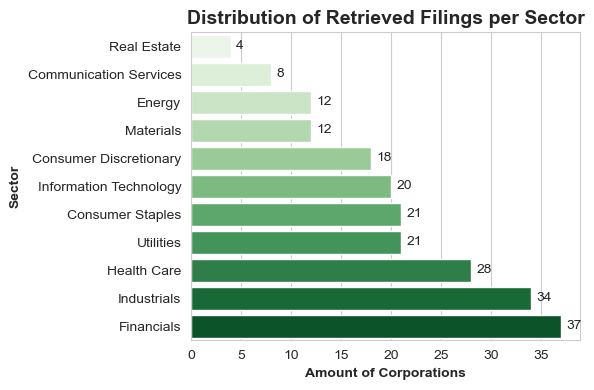

In [17]:
## 1. check sectors, their distribution and filings

# show all unique sectors
for values in data["sector"].unique():
    print(values)

# take unique tickers for the sectors
unique_tickers = data.drop_duplicates(subset=["ticker"])
sector_counts = unique_tickers["sector"].value_counts(dropna=False).reset_index()
sector_counts.columns= ["sector", "count"]
print(sector_counts)

# Plot Histogramm for distribution visualisation of filings
sns.set_style("whitegrid")
sector_counts_sorted = sector_counts.sort_values("count", ascending=True).reset_index(drop=True)
palette = sns.color_palette("Greens", n_colors=len(sector_counts_sorted))

# Histogram
plt.figure(figsize=(6, 4))
sns.barplot(data=sector_counts_sorted, x="count", y="sector", palette=palette)
plt.title("Distribution of Retrieved Filings per Sector", fontsize=14, fontweight="bold")
plt.xlabel("Amount of Corporations", fontweight="semibold")
plt.ylabel("Sector", fontweight="semibold")

# values next to bars
for index, row in sector_counts_sorted.iterrows():
    plt.text(row["count"] + 0.5, index, row["count"], va='center')

plt.tight_layout()
plt.savefig("Sector Information.png", bbox_inches="tight")
plt.show()

##### 1.5. Inspect climate related Words and Sentences

In [18]:
## 1. TOP 10 Corporations with most raw sentences/words
# sentences
print(f"\nTOP 10 Coorporatinons (most sentences)")
top_sentences = data.nlargest(10, 'sentence_count')[['ticker', 'sector', 'sentence_count', 'FiscalYearEnd']]
print(top_sentences)

data["n_climate_words"] = data["climate_words"].apply(lambda x: len(x) if isinstance(x, list) else 0)
data["n_climate_sentences"] = data["climate_sentences"].apply(lambda x: len(x) if isinstance(x, list) else 0)

# sector aggregates
sector_stats = (data.groupby("sector").agg(
        mean_sentence_count=("sentence_count", "mean"),
        median_sentence_count=("sentence_count", "median"),
        min_sentence_count=("sentence_count", "min"),
        max_sentence_count=("sentence_count", "max"),
        std_sentence_count=("sentence_count", "std"),
        n_filings=("sentence_count", "count"),
        total_sentences=("sentence_count", "sum"),
        total_climate_words=("n_climate_words", "sum"),
        total_climate_sentences=("n_climate_sentences", "sum") 
    ).reset_index().sort_values("mean_sentence_count", ascending=False))

#words
print(f"\nTOP 10 Coorporatinons (most words)")
top_words = data.nlargest(10, 'word_count')[['ticker', 'sector', 'word_count', 'FiscalYearEnd']]
print(top_words)

# Categorisation of corporations by documents size (sentences)
data_copy = data.copy()
data_copy['doc_size_category'] = pd.cut(data_copy['sentence_count'], 
                                       bins=[0, 49, 500, 2000, float('inf')],
                                       labels=['very little (<50)', 'medium (50-500)', 
                                              'large (500-2000)', 'very large (>=2000)'], include_lowest=True)

category_stats = data_copy['doc_size_category'].value_counts().sort_index()


TOP 10 Coorporatinons (most sentences)
     ticker      sector  sentence_count  FiscalYearEnd
1393    ETR   Utilities            4927           2005
620       C  Financials            4763           2015
622       C  Financials            4697           2013
619       C  Financials            4662           2016
618       C  Financials            4481           2017
616       C  Financials            4395           2019
621       C  Financials            4294           2014
625       C  Financials            4242           2010
628       C  Financials            4005           2007
627       C  Financials            3315           2008

TOP 10 Coorporatinons (most words)
     ticker      sector  word_count  FiscalYearEnd
1393    ETR   Utilities      138915           2005
620       C  Financials      128563           2015
622       C  Financials      125766           2013
619       C  Financials      125539           2016
618       C  Financials      123159           2017
616       C  

In [19]:
## 2. Inspect Data with no sentence count at all --> no input from sections at all

# show which sector/ticker has no input from risk sections
no_sentences = data[data["sentence_count"] == 0]
print(no_sentences[["ticker", "sector", "FiscalYearEnd"]].head(20))


     ticker      sector  FiscalYearEnd
3103     RF  Financials           2005


In [20]:
## 3. Sector Statistics based on counted Sentences per Filing
sector_stats

,sector,mean_sentence_count,median_sentence_count,min_sentence_count,max_sentence_count,std_sentence_count,n_filings,total_sentences,total_climate_words,total_climate_sentences
4,Financials,398.869376,291.0,0,4763,609.249944,689,274821,2767,6225
10,Utilities,372.277174,257.0,2,4927,458.407264,368,136998,3834,8243
7,Information Technology,267.027100,268.0,1,1074,110.789505,369,98533,1633,2329
9,Real Estate,266.937500,259.5,50,522,103.425059,80,21355,524,673
5,Health Care,245.748980,244.5,1,740,133.135263,490,120417,1428,2201
1,Consumer Discretionary,202.206790,184.0,1,1069,139.323278,324,65515,1318,1761
8,Materials,171.555046,127.0,1,962,151.775389,218,37399,1053,1871
3,Energy,158.871921,121.0,1,1539,159.903137,203,32251,1611,2420
2,Consumer Staples,158.574468,143.5,1,484,85.405572,376,59624,1904,2764
0,Communication Services,156.736364,143.0,20,320,75.604315,110,17241,248,269


##### 1.6. Outlier Detection Analysis

In [21]:
## 1. Count how many filings have less than 50 sentences
## This is a self proclaimed visual cut off to see how many filings are short of input texts

# Amount of  Filings with less than 50 sentences
few_sentences = data[data["sentence_count"] < 50]

print(f"Filings with < 50 sentences: {len(few_sentences)}")
print("\nexamples:")
print(few_sentences[["cik", "FiscalYearEnd", "sentence_count", "sector", "ticker"]].head(20))

# see which sectors have a count of these small filings
sector_few = (few_sentences.groupby("sector").size()
    .reset_index(name="n_filings_<50").sort_values("n_filings_<50", ascending=False))

Filings with < 50 sentences: 269

examples:
         cik  FiscalYearEnd  sentence_count            sector ticker
115     7084           2007              45  Consumer Staples    ADM
116     7084           2006              44  Consumer Staples    ADM
128     8670           2013              44       Industrials    ADP
129     8670           2012              42       Industrials    ADP
130     8670           2011              41       Industrials    ADP
131     8670           2010              38       Industrials    ADP
132     8670           2009              37       Industrials    ADP
133     8670           2008              32       Industrials    ADP
134     8670           2007              32       Industrials    ADP
135     8670           2006              34       Industrials    ADP
269   899051           2005               3        Financials    ALL
558  1390777           2024               1        Financials     BK
559  1390777           2023               1        Financia

In [22]:
## 2. Check which sectors have how many filings smaller than 50 sentences
sector_few

,sector,n_filings_<50
4,Financials,68
6,Industrials,64
8,Materials,31
2,Consumer Staples,25
3,Energy,25
5,Health Care,24
1,Consumer Discretionary,19
0,Communication Services,5
9,Utilities,5
7,Information Technology,3


In [23]:
## 3. sort into bins for rough distribution check
category_stats

doc_size_category
very little (<50)       269
medium (50-500)        3397
large (500-2000)        149
very large (>=2000)      31
Name: count, dtype: int64

In [24]:
## 4. Outlier detection by sentence count of the filings wit IQR Method

# IQR 
# Calculate bounds
Q1 = data["sentence_count"].quantile(0.25)
Q3 = data["sentence_count"].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5*IQR
upper_bound = Q3 + 1.5*IQR

print("Lower bound:", lower_bound)
print("Upper bound:", upper_bound)

lower_outliers = data[data["sentence_count"] < lower_bound]
upper_outliers = data[data["sentence_count"] > upper_bound]

# totals
total = len(data)
n_lower = len(lower_outliers)
n_upper = len(upper_outliers)
n_within = total - n_lower - n_upper - data["sentence_count"].isna().sum()

print(f"Total filings: {total}")
print(f"Above upper bound: {n_upper} ({n_upper/total:.2%})")
print(f"Within bounds: {n_within} ({n_within/total:.2%})")


# Define bounds
data_iqr = data[(data['sentence_count'] >= lower_bound) & (data['sentence_count'] <= upper_bound)]
# Count removed outliers
data_clean = data_iqr.copy()
removed_count = len(data) - len(data_clean)
print("Removed Counts:", removed_count)

# check outliers
outliers = data[(data['sentence_count'] < lower_bound) | (data['sentence_count'] > upper_bound)]
print(f"\nTop 10 removed outliers:")
print(outliers.nlargest(25, 'sentence_count')[['ticker', 'sector', 'sentence_count', 'climate_sentences_normalized']])

## Lower bound outliers not detected as probably heavy right tail distribution as some heavy outliers
# with large filings in terms of sentences present
# next step: plot the distributions


Lower bound: -163.0
Upper bound: 581.0
Total filings: 3846
Above upper bound: 130 (3.38%)
Within bounds: 3716 (96.62%)
Removed Counts: 130

Top 10 removed outliers:
     ticker      sector  sentence_count  climate_sentences_normalized
1393    ETR   Utilities            4927                      0.034301
620       C  Financials            4763                      0.005669
622       C  Financials            4697                      0.004897
619       C  Financials            4662                      0.005363
618       C  Financials            4481                      0.006918
616       C  Financials            4395                      0.009101
621       C  Financials            4294                      0.004425
625       C  Financials            4242                      0.004243
628       C  Financials            4005                      0.008489
627       C  Financials            3315                      0.003017
626       C  Financials            3112                      0.00

##### 1.6. Plot Distributions of Sentence Counts, Normalized Words/Sentences

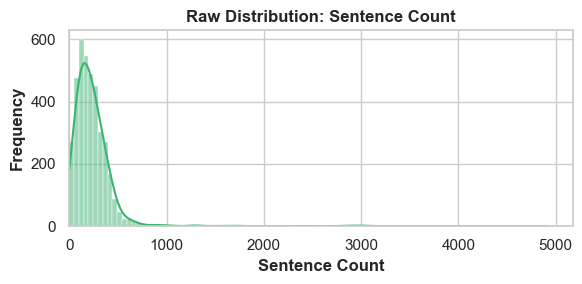

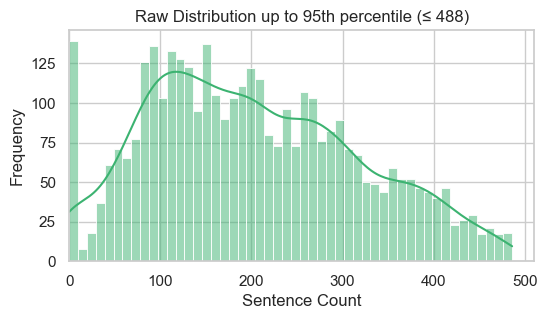

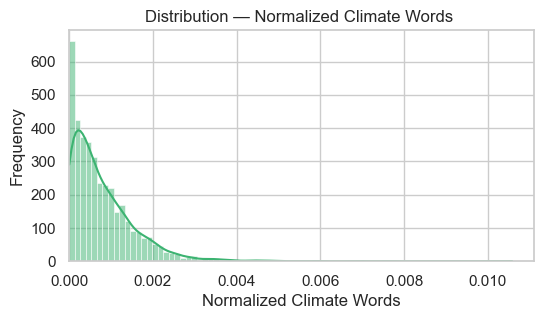

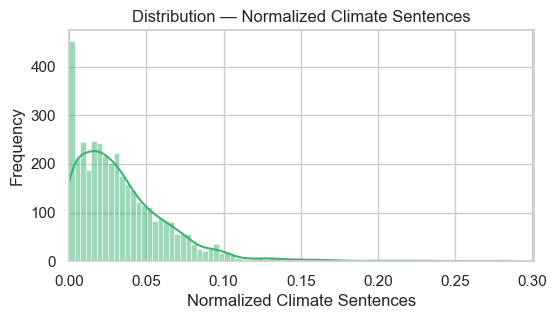

C:\Users\rober\AppData\Local\Temp\ipykernel_11432\2885352346.py:48: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=data['sentence_count'].dropna(), palette="Greens", showfliers=True)


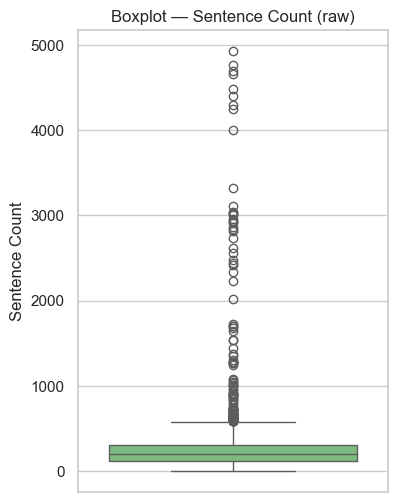

C:\Users\rober\AppData\Local\Temp\ipykernel_11432\2885352346.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x='sector', y='sentence_count', showfliers=True, palette=("Greens"))


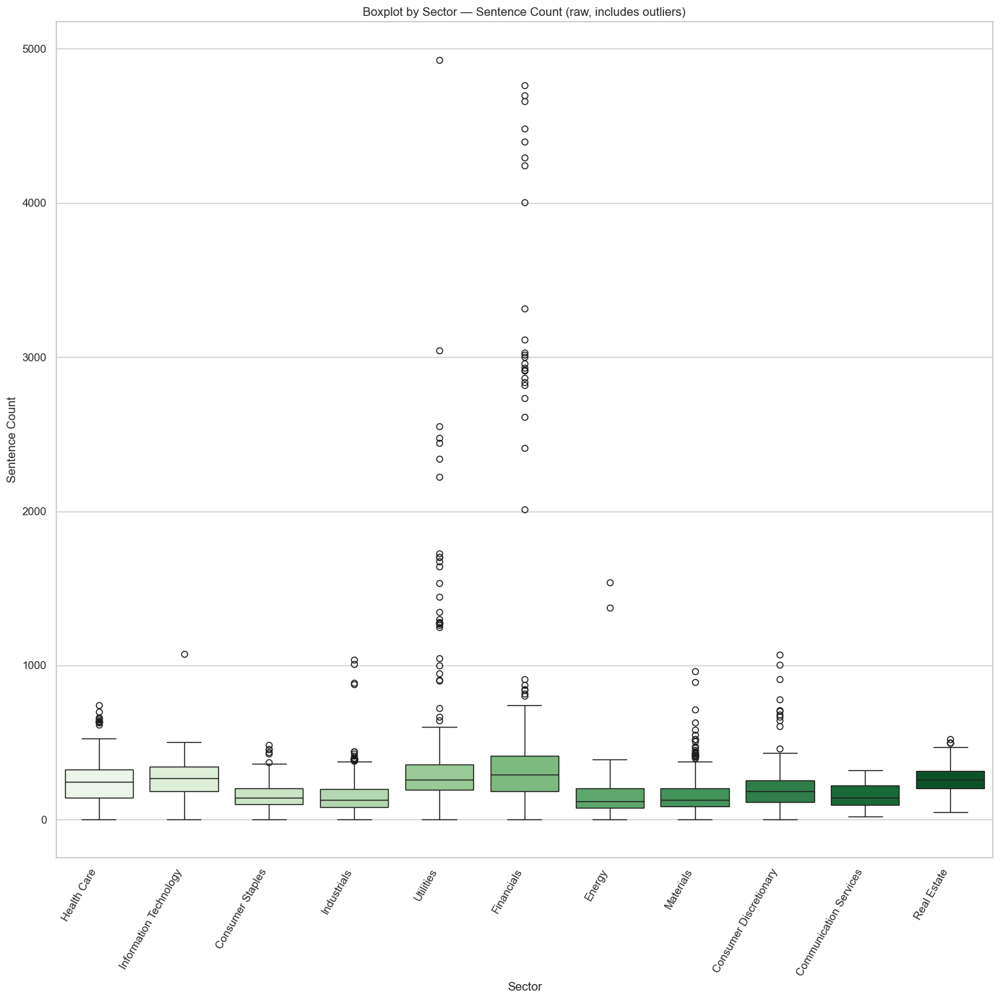

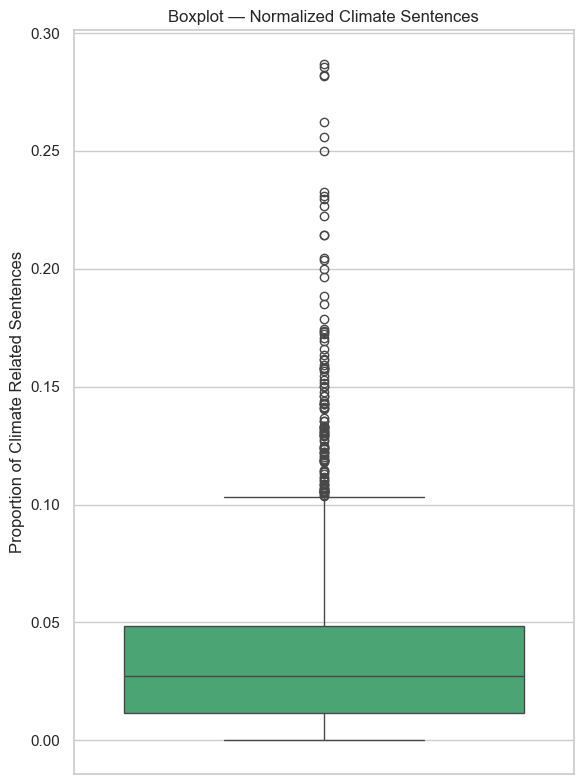

C:\Users\rober\AppData\Local\Temp\ipykernel_11432\2885352346.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x='sector', y='climate_words_normalized', showfliers=True, palette=("Greens"))


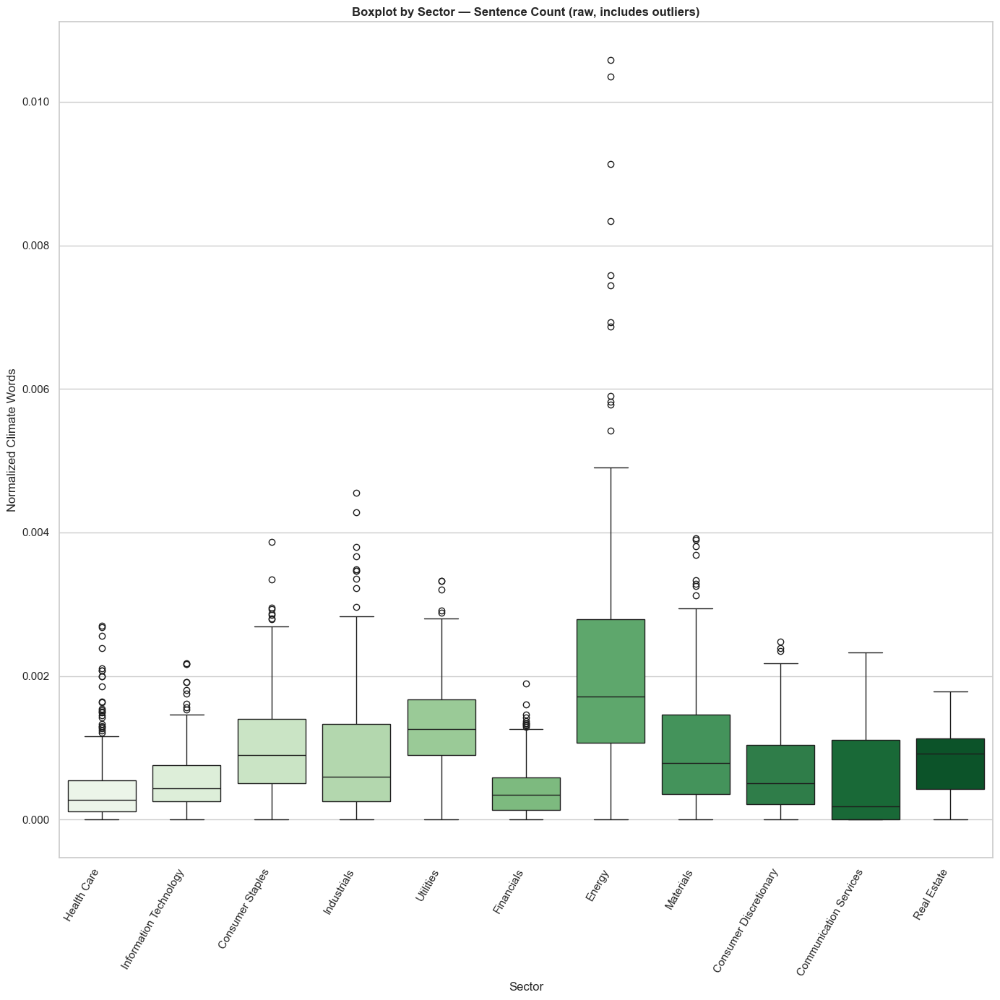

In [25]:
## Plot distributions for visual inspection to see structure and as result from outlier analysis

sns.set_theme(style="whitegrid")
# 1. raw fistribution on sentence_count
plt.figure(figsize=(6,3))
sns.histplot(data['sentence_count'].dropna(), bins=100, kde=True, color="mediumseagreen")
plt.title('Raw Distribution: Sentence Count', fontweight="bold")
plt.xlabel('Sentence Count', fontweight="semibold")
plt.ylabel('Frequency', fontweight="semibold")
plt.xlim(left=0)
plt.tight_layout()
plt.savefig("Sentence count distribution.png")
plt.show()

# 2. distribution up to 95th percentile to see data distribution without heavy tail outliers
x = data['sentence_count'].dropna()
p95 = x.quantile(0.95)
plt.figure(figsize=(6,3))
sns.histplot(x[x <= p95], bins=50, kde=True, color="mediumseagreen")
plt.title(f'Raw Distribution up to 95th percentile (≤ {p95:.0f})')
plt.xlabel('Sentence Count')
plt.ylabel('Frequency')
plt.xlim(left=0)
plt.show()

# 3. normalised climate words distribution
col = 'climate_words_normalized'
plt.figure(figsize=(6,3))
sns.histplot(data[col].dropna(), bins=80, kde=True, color="mediumseagreen")
plt.title(f'Distribution — Normalized Climate Words ')
plt.xlabel('Normalized Climate Words')
plt.ylabel('Frequency')
plt.xlim(left=0)
plt.show()

# 3.1 normalised climate sentences distribution
col = 'climate_sentences_normalized'
plt.figure(figsize=(6,3))
sns.histplot(data[col].dropna(), bins=80, kde=True, color="mediumseagreen")
plt.title(f'Distribution — Normalized Climate Sentences')
plt.xlabel('Normalized Climate Sentences')
plt.ylabel('Frequency')
plt.xlim(left=0)
plt.show()

# 4. Boxplot with raw Sentence Count data
plt.figure(figsize=(4,6))
sns.boxplot(y=data['sentence_count'].dropna(), palette="Greens", showfliers=True)
plt.title('Boxplot — Sentence Count (raw)')
plt.ylabel('Sentence Count')
plt.show()

# 5. Boxplot with sentence Counts by industrial sectors
plt.figure(figsize=(14,14))
sns.boxplot(data=data, x='sector', y='sentence_count', showfliers=True, palette=("Greens"))
plt.xticks(rotation=60, ha='right')
plt.ylabel("Sentence Count")
plt.xlabel("Sector")
plt.title('Boxplot by Sector — Sentence Count (raw, includes outliers)')
plt.tight_layout()
plt.show()

# 6. Boxplot 
plt.figure(figsize=(6,8))
sns.boxplot(y=data['climate_sentences_normalized'].dropna(), color="mediumseagreen")
plt.title('Boxplot — Normalized Climate Sentences')
plt.ylabel('Proportion of Climate Related Sentences')
plt.tight_layout()
plt.show()

# 7. Boxplot with sentence Counts by industrial sectors
plt.figure(figsize=(14,14))
sns.boxplot(data=data, x='sector', y='climate_words_normalized', showfliers=True, palette=("Greens"))
plt.xticks(rotation=60, ha='right')
plt.ylabel("Normalized Climate Words")
plt.xlabel("Sector")
plt.title('Boxplot by Sector — Sentence Count (raw, includes outliers)', fontweight="bold")
plt.tight_layout()
plt.show()


##### 1.7. Yearly Trends on Normalized Words/Sentences

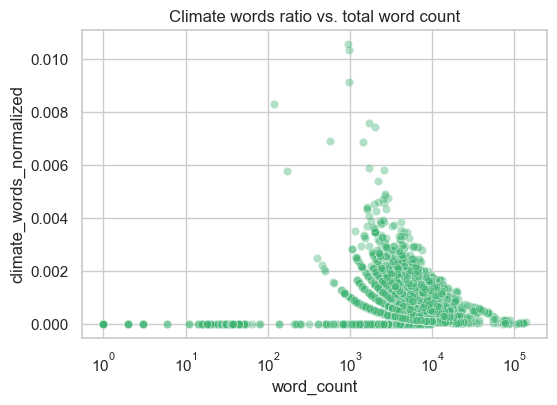

c:\Users\rober\anaconda3\envs\myenv\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\rober\anaconda3\envs\myenv\Lib\site-packages\numpy\_core\function_base.py:162: RuntimeWarning: invalid value encountered in multiply
  y *= step
c:\Users\rober\anaconda3\envs\myenv\Lib\site-packages\numpy\_core\function_base.py:172: RuntimeWarning: invalid value encountered in add
  y += start
c:\Users\rober\anaconda3\envs\myenv\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1617: RuntimeWarning: All-NaN slice encountered
  return fnb._ureduce(a,


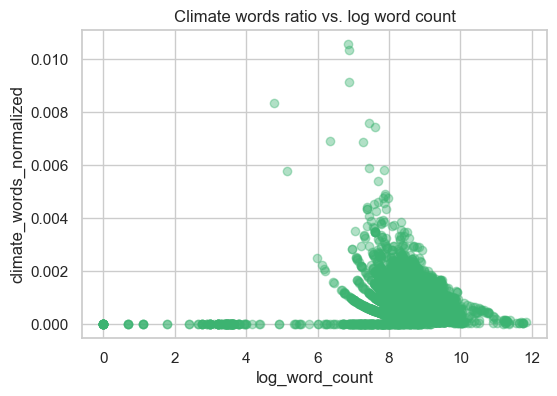

C:\Users\rober\AppData\Local\Temp\ipykernel_11432\643776780.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x="FiscalYearEnd", y="climate_words_normalized", palette="Greens", showfliers=True)


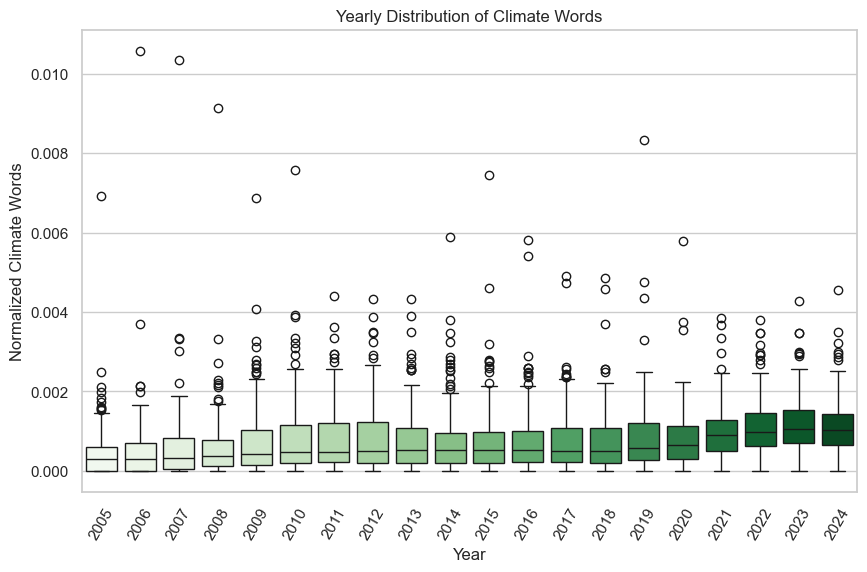

C:\Users\rober\AppData\Local\Temp\ipykernel_11432\643776780.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x="FiscalYearEnd", y="climate_words_normalized", palette="Greens", showfliers=False)


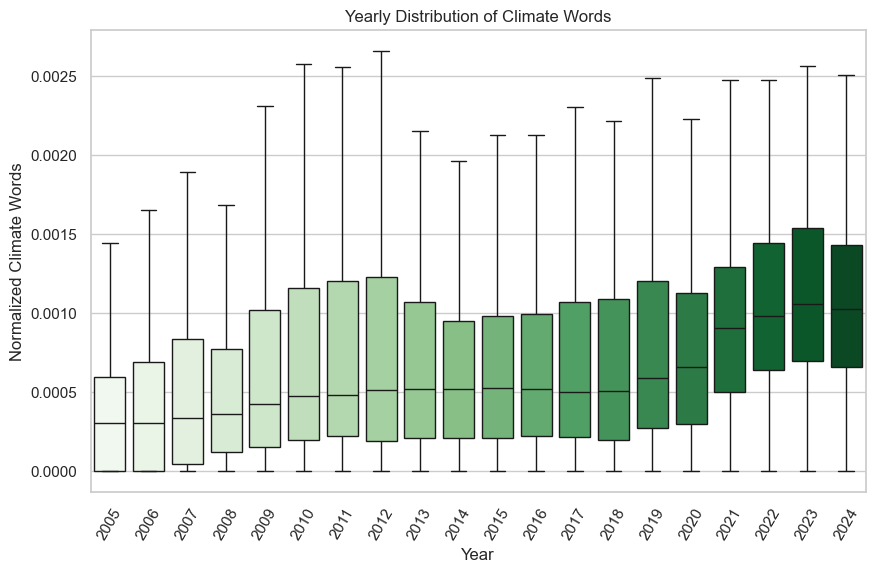

C:\Users\rober\AppData\Local\Temp\ipykernel_11432\643776780.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x="FiscalYearEnd", y="climate_sentences_normalized", palette="Greens", showfliers=True)


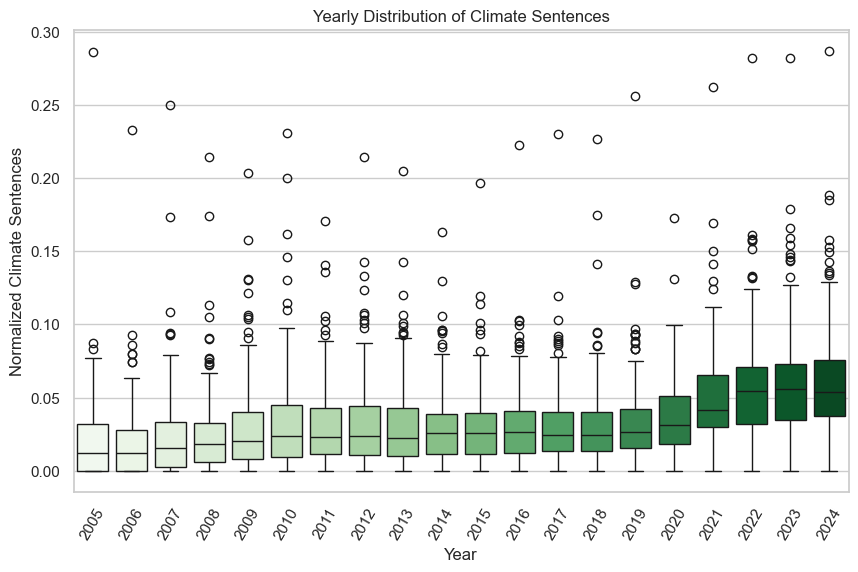

C:\Users\rober\AppData\Local\Temp\ipykernel_11432\643776780.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x="FiscalYearEnd", y="climate_sentences_normalized", palette="Greens", showfliers=False)


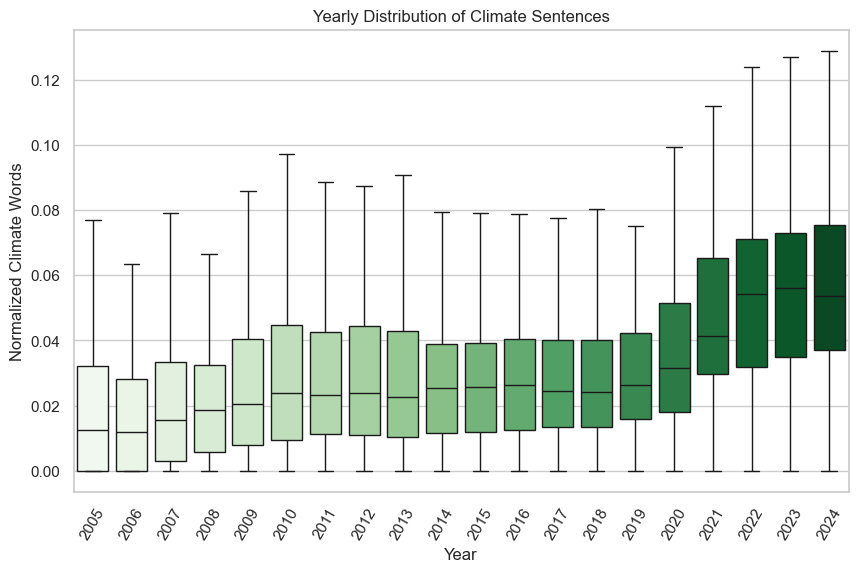

In [26]:
## 1. Analyze yearly trends concernign ccliamze related words and sentences

# Scatterplot climate_words_ratio vs. word_count with log scale
plt.figure(figsize=(6,4))
sns.scatterplot(data=data, x="word_count", y="climate_words_normalized", alpha=0.4, color ="mediumseagreen")
plt.xscale("log")
plt.title("Climate words ratio vs. total word count")
plt.show()

data["log_word_count"] = np.log(data["word_count"])

plt.figure(figsize=(6,4))
sns.regplot(
    data=data, 
    x="log_word_count", 
    y="climate_words_normalized",
    scatter_kws={"alpha":0.4, "color":"mediumseagreen"},
    line_kws={"color":"darkred"})
plt.title("Climate words ratio vs. log word count")
plt.show()

## 2. analysis on climate words
# Timeweise trend with outliers
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x="FiscalYearEnd", y="climate_words_normalized", palette="Greens", showfliers=True)
plt.xlabel("Year")
plt.ylabel("Normalized Climate Words")
plt.xticks(rotation=60)
plt.title("Yearly Distribution of Climate Words")
plt.show()

# Timewise trends without outliers
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x="FiscalYearEnd", y="climate_words_normalized", palette="Greens", showfliers=False)
plt.xlabel("Year")
plt.ylabel("Normalized Climate Words")
plt.xticks(rotation=60)
plt.title("Yearly Distribution of Climate Words")
plt.show()

## 3. analysis on climate sentences
# Timeweise trend with outliers
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x="FiscalYearEnd", y="climate_sentences_normalized", palette="Greens", showfliers=True)
plt.xlabel("Year")
plt.ylabel("Normalized Climate Sentences")
plt.xticks(rotation=60)
plt.title("Yearly Distribution of Climate Sentences")
plt.show()

# Timewise trends without outliers
plt.figure(figsize=(10,6))
sns.boxplot(data=data, x="FiscalYearEnd", y="climate_sentences_normalized", palette="Greens", showfliers=False)
plt.xlabel("Year")
plt.ylabel("Normalized Climate Words")
plt.xticks(rotation=60)
plt.title("Yearly Distribution of Climate Sentences")
plt.show()


In [27]:
data


,cik,FiscalYearEnd,sentence_count,word_count,climate_sentences_count,climate_words_count,climate_sentences_normalized,ticker,sentences,climate_sentences,climate_words,climate_words_list,sector,n_filings,climate_words_normalized,n_climate_words,n_climate_sentences,log_word_count
0,1090872,2024,304,9063,13,8,0.042763,A,[Business and Strategic Risks General economic...,"[Also, in such an environment, pricing pressur...","[climate change, drought, earthquake, environm...","[climate change, drought, earthquake, environm...",Health Care,25,0.000883,8,13,9.111955
1,1090872,2023,295,8662,11,8,0.037288,A,[Business and Strategic Risks General economic...,"[Also, in such an environment, pricing pressur...","[climate change, drought, earthquake, environm...","[climate change, drought, earthquake, environm...",Health Care,25,0.000924,8,11,9.066701
2,1090872,2022,291,8548,8,8,0.027491,A,[Business and Strategic Risks The COVID-19 pan...,"[As COVID-19 conditions have improved, the dur...","[climate change, drought, earthquake, environm...","[climate change, drought, earthquake, environm...",Health Care,24,0.000936,8,8,9.053453
3,1090872,2021,300,8792,7,6,0.023333,A,[Business and Strategic Risks The COVID-19 pan...,"[To the extent COVID-19 conditions improve, th...","[climate change, earthquake, environment, extr...","[climate change, earthquake, environment, extr...",Health Care,24,0.000682,6,7,9.081597
4,1090872,2020,298,8636,7,6,0.023490,A,"[Risks, Uncertainties and Other Factors Specif...","[To the extent COVID-19 conditions improve, th...","[climate change, earthquake, environment, extr...","[climate change, earthquake, environment, extr...",Health Care,23,0.000695,6,7,9.063695
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3841,1136869,2009,117,3511,1,1,0.008547,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment],Health Care,24,0.000285,1,1,8.163656
3842,1136869,2008,134,4048,1,1,0.007463,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment],Health Care,23,0.000247,1,1,8.305978
3843,1136869,2007,178,5109,1,1,0.005618,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment],Health Care,23,0.000196,1,1,8.538759
3844,1136869,2006,161,4618,1,1,0.006211,ZBH,[Risk factors which could cause actual results...,[We operate in ahighly competitive environment.],[environment],[environment],Health Care,23,0.000217,1,1,8.437717


In [28]:
## 1. Kruskal–Wallis over all sectors
# group normalized metric by sector
sector_groups = [group["climate_sentences_normalized"].dropna().values 
                 for _, group in data.groupby("sector")]

# kruskal test
kw_stat, kw_p = kruskal(*sector_groups)
print(f"Kruskal–Wallis H={kw_stat:.3f}, p={kw_p:.4g}")


##  Pairwise Mann–Whitney-U if global test is significangt
# if p value less than significance level append to results list
if kw_p < 0.05:
    results = []
    for (s1, g1), (s2, g2) in combinations(data.groupby("sector"), 2):
        u_stat, p_val = mannwhitneyu(
            g1["climate_sentences_normalized"].dropna(), 
            g2["climate_sentences_normalized"].dropna(),
            alternative="two-sided")
        results.append([s1, s2, u_stat, p_val])

    # results to dataframe
    results_df = pd.DataFrame(results, columns=["Sector1", "Sector2", "U_stat", "p_raw"])

    # correct for multiple test (FDR)
    reject, p_adj, _, _ = multipletests(results_df["p_raw"], method="fdr_bh")
    results_df["p_adj"] = p_adj
    results_df["significant"] = reject

    print("\npairwise Mann–Whitney-U results(with FDR correcting):")
    display(results_df.sort_values("p_adj"))
else:
    print("no statistically significant difference between the sectors (Kruskal–Wallis).")


Kruskal–Wallis H=954.805, p=1.013e-198

pairwise Mann–Whitney-U results(with FDR correcting):


,Sector1,Sector2,U_stat,p_raw,p_adj,significant
44,Health Care,Utilities,13441.0,2.995111e-101,1.647311e-99,True
39,Financials,Utilities,32880.0,8.440806e-88,2.321222e-86,True
51,Information Technology,Utilities,17768.5,2.107805e-67,3.864310e-66,True
28,Energy,Health Care,90401.0,1.397299e-64,1.921285e-63,True
48,Industrials,Utilities,45976.5,1.683264e-55,1.851591e-54,True
27,Energy,Financials,120284.0,5.973118e-55,5.475359e-54,True
21,Consumer Staples,Health Care,148847.0,1.344889e-54,1.056699e-53,True
18,Consumer Discretionary,Utilities,20064.0,2.395605e-51,1.646979e-50,True
30,Energy,Information Technology,64426.0,3.767922e-46,2.302619e-45,True
9,Communication Services,Utilities,3233.5,7.535426e-41,4.144484e-40,True


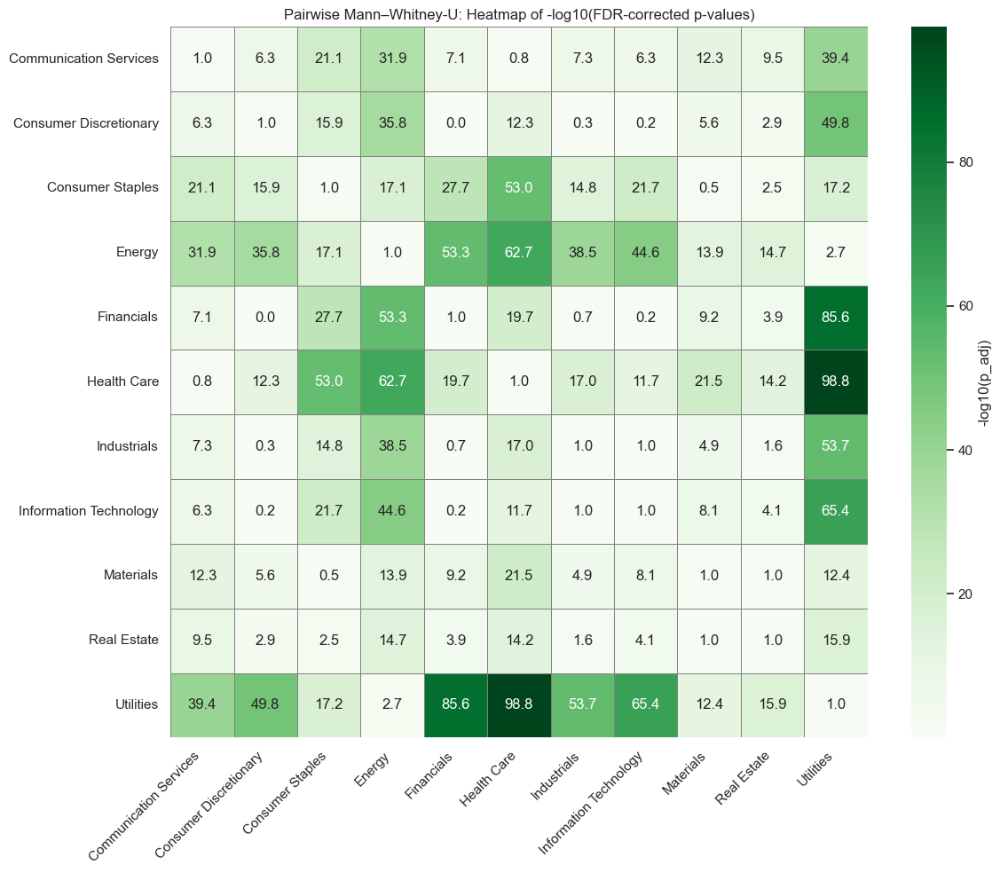

In [29]:
# Take the results from your results_df
# results_df must have the columns ["Sector1", "Sector2", "p_adj", "significant"]

# All sectors in the same order
sectors = sorted(data['sector'].unique())

# Create empty DataFrame for the heatmap
heatmap_matrix = pd.DataFrame(np.ones((len(sectors), len(sectors))), index=sectors, columns=sectors)

# Fill in values: p_adj as -log10(p) for better color scaling
for _, row in results_df.iterrows():
    s1, s2, p_adj, sig = row["Sector1"], row["Sector2"], row["p_adj"], row["significant"]
    heatmap_matrix.loc[s1, s2] = -np.log10(p_adj)
    heatmap_matrix.loc[s2, s1] = -np.log10(p_adj)  # symmetric

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(
    heatmap_matrix, 
    annot=True, fmt=".1f", cmap="Greens", 
    cbar_kws={'label': '-log10(p_adj)'}, 
    linewidths=0.5, 
    linecolor='gray')
plt.title("Pairwise Mann–Whitney-U: Heatmap of -log10(FDR-corrected p-values)")
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

#### 1.8. Analyze Sectors by aggregates with median/mean comparisons of normalized metrics

C:\Users\rober\AppData\Local\Temp\ipykernel_11432\2553370229.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x='sector', y='climate_words_normalized', order=sector_order, showfliers=False, palette="Greens")


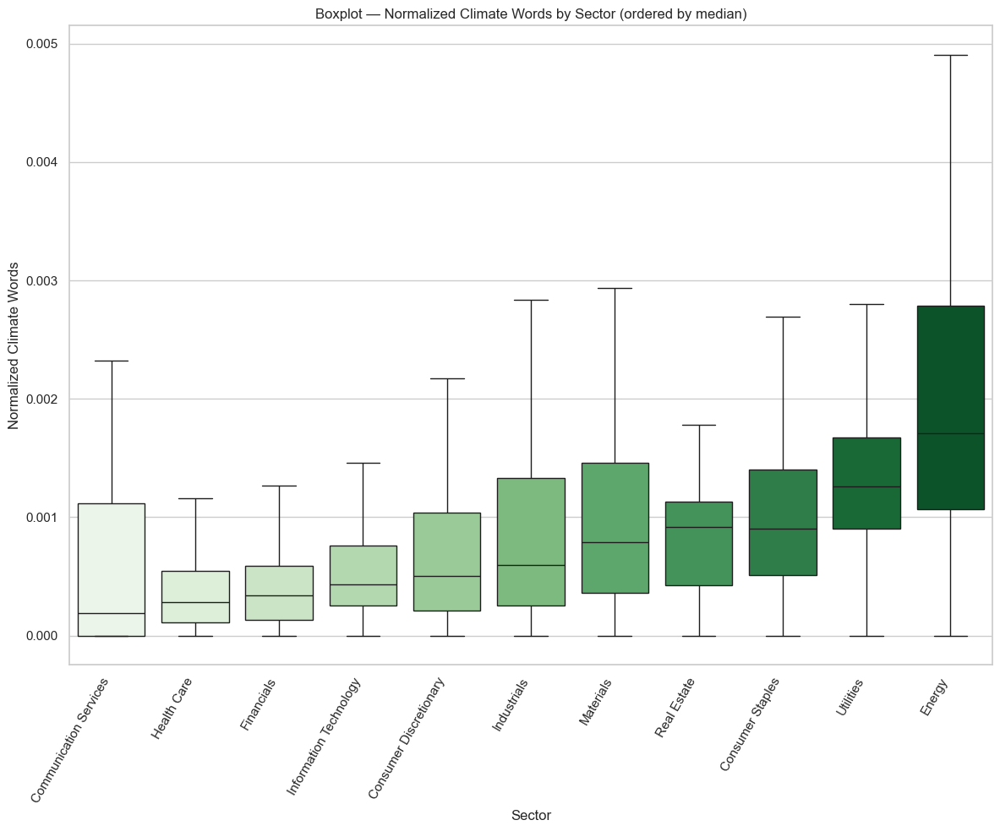

C:\Users\rober\AppData\Local\Temp\ipykernel_11432\2553370229.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data.merge(data_aggregated[['FiscalYearEnd','sector']], on=['sector'], how='right'),


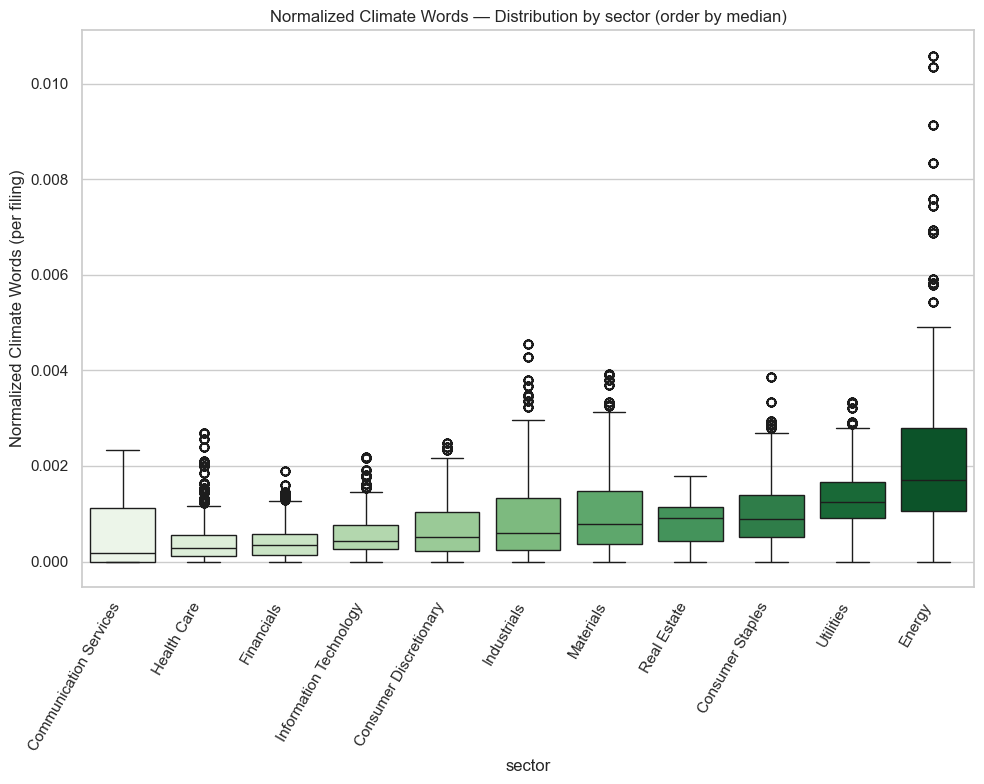

C:\Users\rober\AppData\Local\Temp\ipykernel_11432\2553370229.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


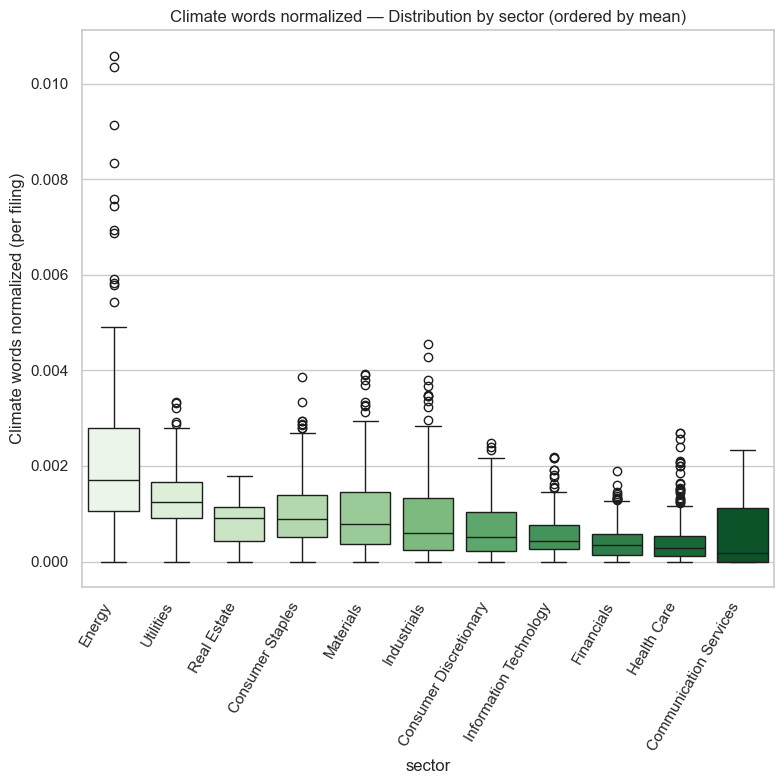

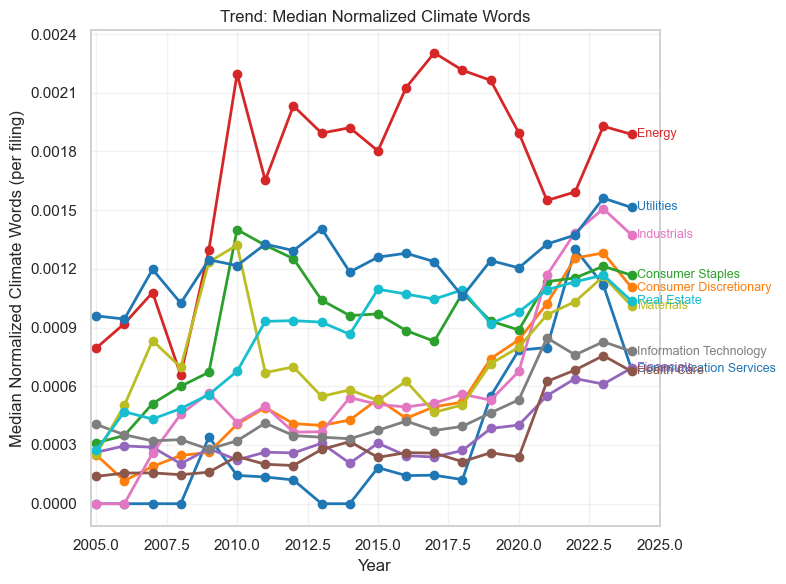

In [30]:
## 1. order aggregated data by sectors and display median/mean normalized metrics

# set plot visuals
sns.set_theme(style="whitegrid")
palette = sns.color_palette("Greens")  

## 2. aggregated dataframe
# access aggregated dataframe, group by median 
sector_order = (data_aggregated.groupby('sector')['median_climate_words_normalized']
                .median().sort_values(ascending=True).index.tolist())

plt.figure(figsize=(12,10))
sns.boxplot(data=data, x='sector', y='climate_words_normalized', order=sector_order, showfliers=False, palette="Greens")
plt.xticks(rotation=60, ha='right')
plt.title('Boxplot — Normalized Climate Words by Sector (ordered by median)')
plt.ylabel('Normalized Climate Words')
plt.xlabel('Sector')
plt.tight_layout()
plt.show()

# order by median
plt.figure(figsize=(10,8))
sns.boxplot(data=data.merge(data_aggregated[['FiscalYearEnd','sector']], on=['sector'], how='right'), 
            x='sector', y='climate_words_normalized', order=sector_order, palette="Greens")
plt.xticks(rotation=60, ha='right')
plt.title('Normalized Climate Words — Distribution by sector (order by median)')
plt.ylabel('Normalized Climate Words (per filing)')
plt.tight_layout()
plt.show()

# order by median
sector_order_mean = data.groupby('sector')['climate_words_normalized'].median() \
                  .sort_values(ascending=False).index.tolist()
plt.figure(figsize=(8,8))
sns.boxplot(
    data=data,
    x='sector',
    y='climate_words_normalized',
    order=sector_order_mean, palette="Greens")
plt.xticks(rotation=60, ha='right')
plt.title('Climate words normalized — Distribution by sector (ordered by mean)')
plt.ylabel('Climate words normalized (per filing)')
plt.tight_layout()
plt.show()

# Analyze Mean of Mean climate related words per sector
top_sectors = data_aggregated.groupby('sector')['median_climate_words_normalized'].mean().index.tolist()

pivot_ts = data_aggregated[data_aggregated['sector'].isin(top_sectors)].pivot(index='FiscalYearEnd', columns='sector', values='median_climate_words_normalized').sort_index()

plt.figure(figsize=(8,6))
colors = sns.color_palette("tab10", n_colors=len(pivot_ts.columns))
for col, c in zip(pivot_ts.columns, colors):
    plt.plot(pivot_ts.index, pivot_ts[col], marker='o', linewidth=2, label=col, color=c)

# label sectors to lines
x_last = pivot_ts.index.max()
x_pos = x_last + 0.2
for i, col in enumerate(pivot_ts.columns):
    y_last = pivot_ts[col].dropna().iloc[-1]
    plt.text(x_pos, y_last, col, va='center', color=colors[i], fontsize=9)

plt.title('Trend: Median Normalized Climate Words')
plt.xlabel('Year')
plt.ylabel('Median Normalized Climate Words (per filing)')
plt.xlim(pivot_ts.index.min()-0.2, pivot_ts.index.max()+1) 
plt.grid(alpha=0.25)
 # whole integer as tickers
plt.gca().yaxis.set_major_locator(mticker.MaxNLocator(integer=True))
plt.tight_layout()
plt.show()

##### 1.9. Summary Statistics 

In [31]:
##summary table of mean/median of mean/median per sectors 

#Summary statistics
summary_table = (data_aggregated.groupby('sector').agg(
    mean_density=('mean_climate_words_normalized','mean'),
    median_density=('median_climate_words_normalized','median'),
    mean_sentences_density=('median_climate_sentences_normalized','mean'),
    median_sentences_density=('median_climate_sentences_normalized','median'),
    total_climate_words=('total_climate_words','sum'),
    total_climate_sentences=('total_climate_sentences','sum'),
    n_filings=('n_filings','sum')).sort_values('mean_density', ascending=False).reset_index())

# extra columns, average climate words/sentences pro Filing
summary_table = summary_table.assign(avg_climate_words_per_filing = lambda data: data['total_climate_words'] / data['n_filings'],
    avg_climate_sentences_per_filing = lambda data: data['total_climate_sentences'] / data['n_filings'])
# division by 0 leads to na
summary_table[['avg_climate_words_per_filing','avg_climate_sentences_per_filing']] = (
    summary_table[['avg_climate_words_per_filing','avg_climate_sentences_per_filing']]
    .replace([np.inf, -np.inf], np.nan).fillna(0).round(2))
summary_table

,sector,mean_density,median_density,mean_sentences_density,median_sentences_density,total_climate_words,total_climate_sentences,n_filings,avg_climate_words_per_filing,avg_climate_sentences_per_filing
0,Energy,0.002171,0.001891,0.073366,0.060855,1611,2420,203,7.94,11.92
1,Utilities,0.001302,0.001245,0.056095,0.053817,3834,8243,368,10.42,22.40
2,Consumer Staples,0.001004,0.000966,0.041431,0.041524,1904,2764,376,5.06,7.35
3,Materials,0.000987,0.000698,0.038044,0.036950,1053,1871,218,4.83,8.58
4,Real Estate,0.000860,0.000934,0.032944,0.032257,524,673,80,6.55,8.41
5,Industrials,0.000820,0.000510,0.025218,0.019242,2284,3357,619,3.69,5.42
6,Consumer Discretionary,0.000667,0.000464,0.025119,0.020996,1318,1761,324,4.07,5.44
7,Information Technology,0.000543,0.000385,0.023572,0.020092,1633,2329,369,4.43,6.31
8,Communication Services,0.000507,0.000144,0.009107,0.005122,248,269,110,2.25,2.45
9,Financials,0.000403,0.000285,0.025809,0.022125,2767,6225,689,4.02,9.03


C:\Users\rober\AppData\Local\Temp\ipykernel_11432\282929780.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data_aggregated,x='sector',y='climate_words_pct',order=sector_order_words,


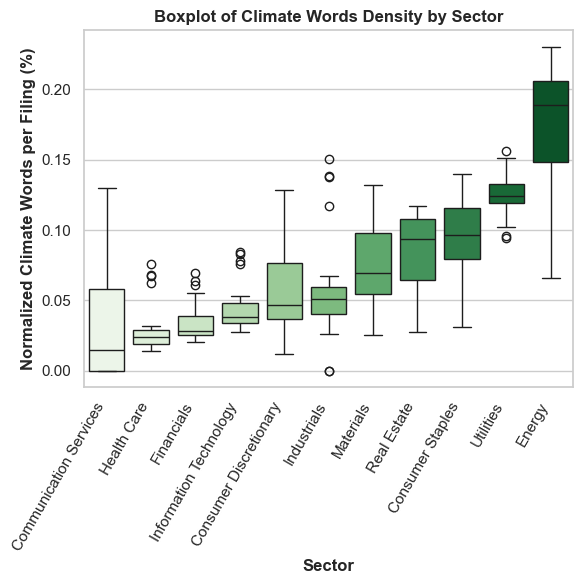

C:\Users\rober\AppData\Local\Temp\ipykernel_11432\282929780.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data_aggregated,


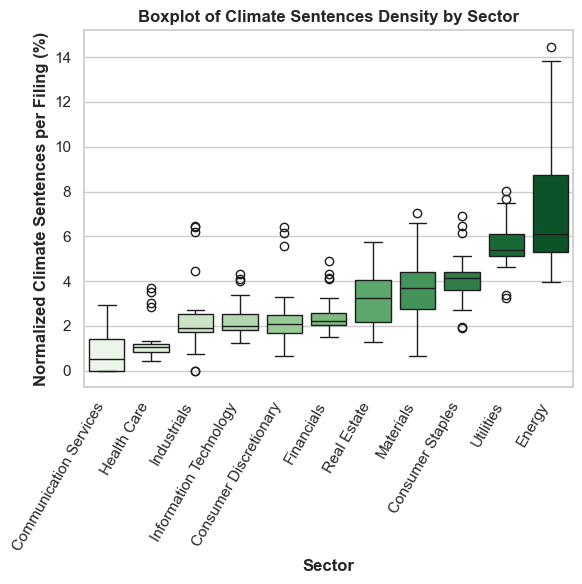

In [32]:
sns.set_theme(style="whitegrid")

# Climate Words Boxplot of aggregated data in percent
data_aggregated['climate_words_pct'] = data_aggregated['median_climate_words_normalized'] * 100
sector_order_words = (data_aggregated.groupby('sector')['median_climate_words_normalized']
                      .median().sort_values(ascending=True).index.tolist())

plt.figure(figsize=(6,6))
sns.boxplot(data=data_aggregated,x='sector',y='climate_words_pct',order=sector_order_words,
    palette="Greens", showfliers=True)
plt.xticks(rotation=60, ha='right')
plt.ylabel('Normalized Climate Words per Filing (%)', fontweight="semibold")
plt.xlabel('Sector', fontweight="semibold")
plt.title('Boxplot of Climate Words Density by Sector',fontweight="bold")
plt.tight_layout()
# plt.savefig('Plots/boxplot_climate_words_by_sector.png')
plt.show()


# Climate Sentences Boxplot of aggregated data in percent
data_aggregated['climate_sentences_pct'] = data_aggregated['median_climate_sentences_normalized'] * 100
sector_order_sents = (data_aggregated.groupby('sector')['median_climate_sentences_normalized']
                      .median()
                      .sort_values(ascending=True)
                      .index.tolist())

plt.figure(figsize=(6,6))
sns.boxplot(data=data_aggregated,
    x='sector', y='climate_sentences_pct',
    order=sector_order_sents,
    palette="Greens",
    showfliers=True)
plt.xticks(rotation=60, ha='right')
plt.ylabel('Normalized Climate Sentences per Filing (%)', fontweight="semibold")
plt.xlabel('Sector', fontweight="semibold")
plt.title('Boxplot of Climate Sentences Density by Sector', fontweight="bold")
plt.tight_layout()
plt.savefig('Boxplot_climate_sentences_by_sector.png')
plt.show()



C:\Users\rober\AppData\Local\Temp\ipykernel_11432\3490882861.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=plot_data, y="sector", x="median_density", palette=palette)


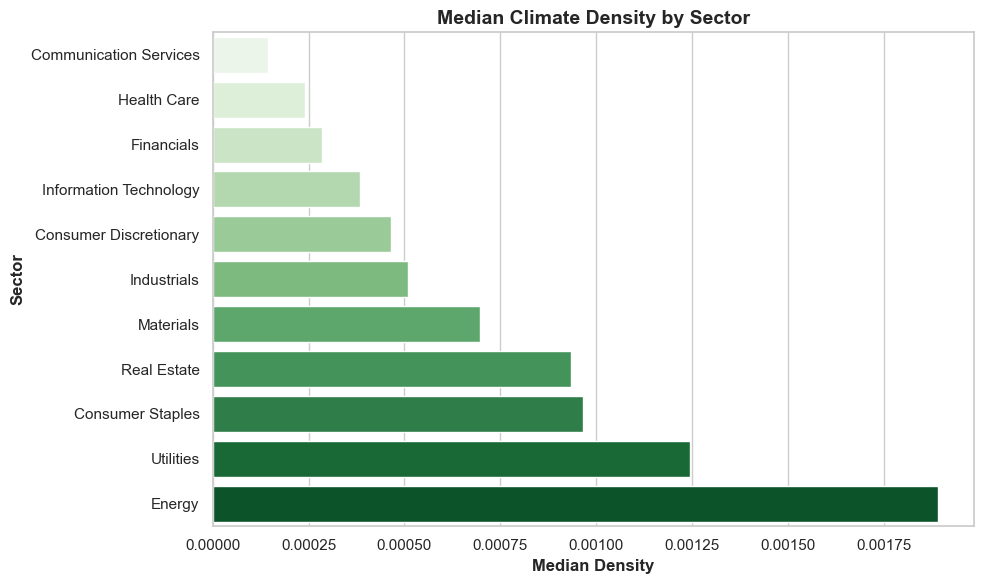

In [33]:

# Sort by value and plot Bar Plot
plot_data = summary_table.sort_values("median_density", ascending=True)

n = len(plot_data)
palette = sns.color_palette("Greens", n)
plt.figure(figsize=(10,6))
sns.barplot(data=plot_data, y="sector", x="median_density", palette=palette)

plt.xlabel("Median Density", fontsize=12, fontweight="semibold")
plt.ylabel("Sector", fontsize=12, fontweight="semibold")
plt.title("Median Climate Density by Sector", fontsize=14, fontweight="bold")

plt.tight_layout()
plt.show()

#### 1.9. Line Plots: Risk Disclosure over Time

,FiscalYearEnd,filings,mean_ratio,median_ratio,mean_climate_sentences,mean_climate_words,share_any_climate
0,2005,134,0.020269,0.012390,3.731343,1.529851,0.679104
1,2006,192,0.019223,0.011949,3.307292,1.697917,0.703125
2,2007,193,0.023049,0.015504,3.492228,2.113990,0.756477
3,2008,195,0.024562,0.018519,4.451282,2.497436,0.805128
4,2009,198,0.028994,0.020610,5.404040,3.186869,0.833333
5,2010,200,0.032356,0.023810,6.905000,3.730000,0.895000
6,2011,199,0.031092,0.023392,6.005025,3.909548,0.894472
7,2012,202,0.031571,0.023913,6.069307,4.004950,0.881188
8,2013,202,0.030628,0.022684,6.237624,4.079208,0.886139
9,2014,197,0.029502,0.025547,6.431472,4.152284,0.908629


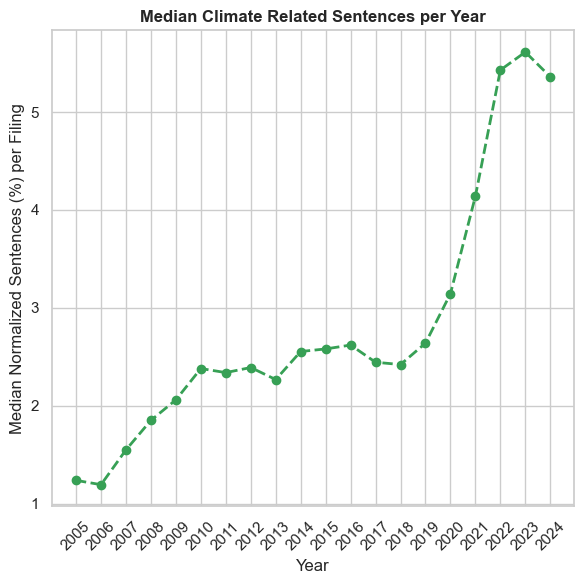

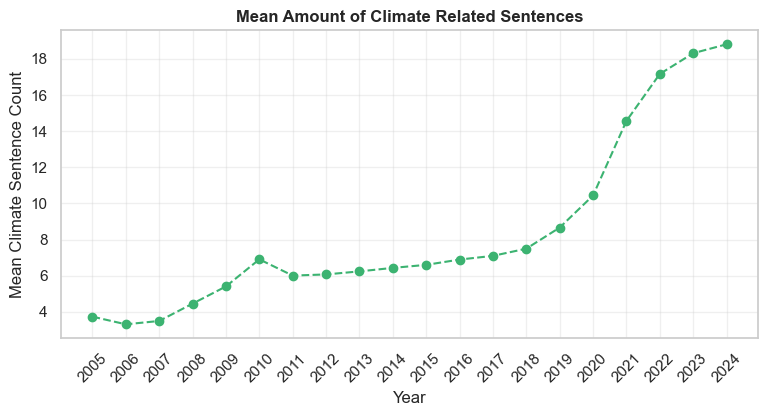

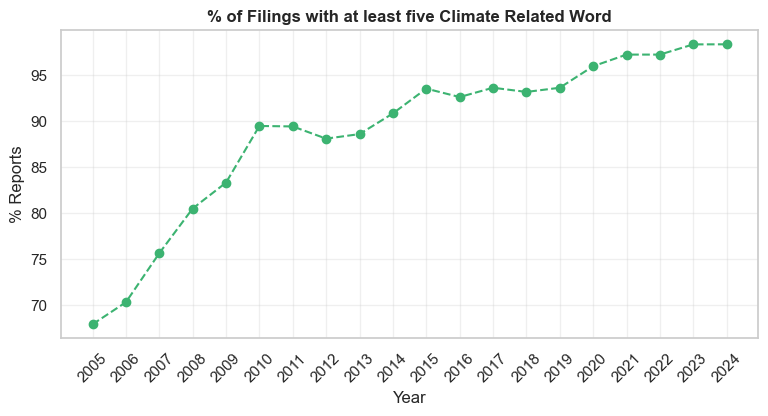

In [34]:
## Yearly aggregates over time
yearly = (data.groupby('FiscalYearEnd').agg(filings=('ticker', 'size'),mean_ratio=('climate_sentences_normalized', 'mean'),
          median_ratio=('climate_sentences_normalized', 'median'),
          mean_climate_sentences=('climate_sentences_count', 'mean'),
          mean_climate_words=('climate_words_count', 'mean'),
          share_any_climate=('climate_words_count', lambda s: (s > 0).mean())).reset_index())

display(yearly)

sns.set_style("whitegrid")
## Visualisations
# Lineplot for mean climate sentences per Year
plt.figure(figsize=(6,6))
plt.plot(yearly['FiscalYearEnd'], yearly['median_ratio']*100, marker='o', color=sns.color_palette("Greens",8)[5],linestyle="--", linewidth=2)
plt.title('Median Climate Related Sentences per Year', fontweight="bold")
plt.xlabel('Year')
plt.ylabel('Median Normalized Sentences (%) per Filing')
plt.xticks(yearly['FiscalYearEnd'],rotation = 45) 
plt.tight_layout()
plt.savefig("Line Plot over years.png")
plt.show()

plt.figure(figsize=(9,4))
plt.plot(yearly['FiscalYearEnd'], yearly['mean_climate_sentences'], marker='o', color="mediumseagreen",linestyle="--" )
plt.title('Mean Amount of Climate Related Sentences', fontweight="bold")
plt.xlabel('Year'); plt.ylabel('Mean Climate Sentence Count')
plt.grid(True, alpha=0.3)
plt.xticks(yearly['FiscalYearEnd'],rotation = 45)
plt.show()

plt.figure(figsize=(9,4))
plt.plot(yearly['FiscalYearEnd'], 100*yearly['share_any_climate'], marker='o', linestyle="--", color="mediumseagreen")
plt.title('% of Filings with at least five Climate Related Word', fontweight="bold")
plt.xlabel('Year')
plt.ylabel('% Reports')
plt.grid(True, alpha=0.3)
plt.xticks(yearly['FiscalYearEnd'], rotation = 45)
plt.show()

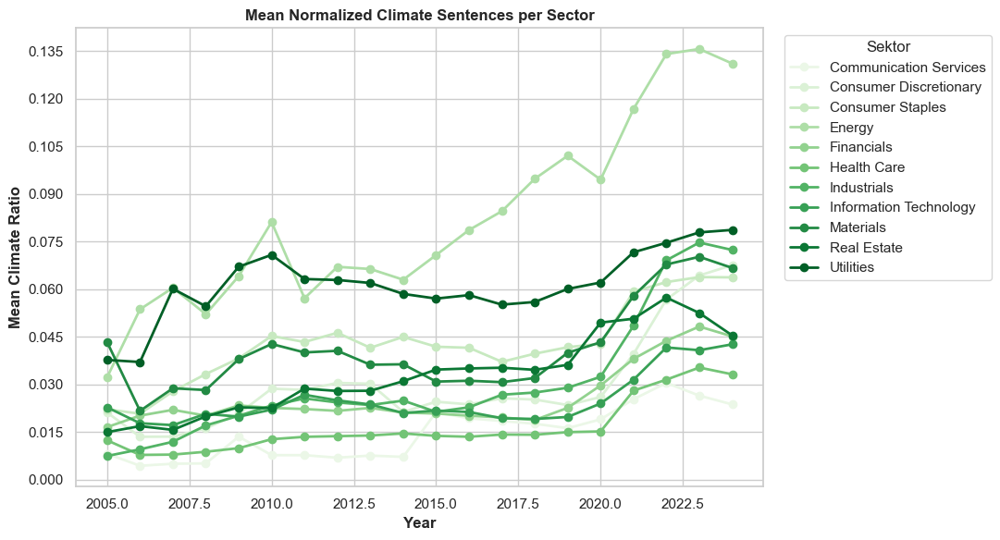

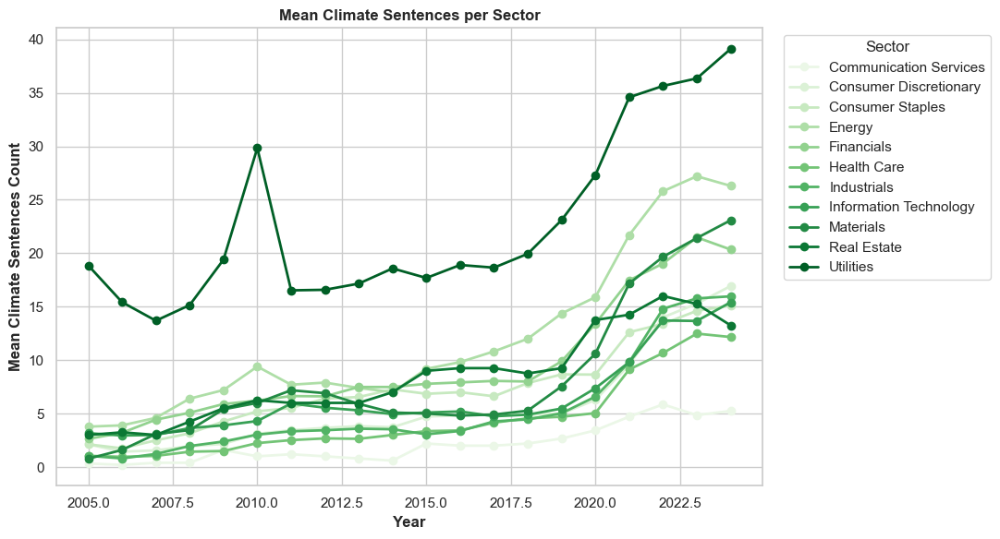

In [35]:
# Per Year and Sector: Mean climate_ratio
sec_yearly = (data.groupby(['FiscalYearEnd','sector'])
      .agg(mean_ratio=('climate_sentences_normalized','mean'),
           mean_climate_sentences=('climate_sentences_count','mean')).reset_index())


# Pivot forPlot
pivot_ratio = sec_yearly.pivot(index='FiscalYearEnd', columns='sector', values='mean_ratio').sort_index()
pivot_sent  = sec_yearly.pivot(index='FiscalYearEnd', columns='sector', values='mean_climate_sentences').sort_index()
sns.set_style("whitegrid")
palette = sns.color_palette("Greens", n_colors=len(pivot_ratio.columns))

# Mean ratio - Lineplot
plt.figure(figsize=(11,6))
pivot_ratio.plot(marker='o', linewidth=2, ax=plt.gca(), color=palette)
plt.title('Mean Normalized Climate Sentences per Sector', fontweight="bold")
plt.xlabel('Year', fontweight="semibold")
plt.ylabel('Mean Climate Ratio', fontweight="bold")
plt.legend(title='Sektor', bbox_to_anchor=(1.02,1), loc='upper left')
plt.grid(True)
 # whole integer as tickers
plt.gca().yaxis.set_major_locator(mticker.MaxNLocator(integer=True))
plt.tight_layout()
plt.show()

# Mean climate sentences - Lineplot
plt.figure(figsize=(11,6))
pivot_sent.plot(marker='o', linewidth=2, ax=plt.gca(), color=palette)
plt.title('Mean Climate Sentences per Sector', fontweight="bold")
plt.xlabel('Year', fontweight="semibold")
plt.ylabel('Mean Climate Sentences Count', fontweight="semibold")
plt.legend(title='Sector', bbox_to_anchor=(1.02,1), loc='upper left')
plt.grid(True)
 # whole integer as tickers
plt.gca().yaxis.set_major_locator(mticker.MaxNLocator(integer=True))
plt.tight_layout()
plt.show()

#### 1.10. Stacked Area Plots

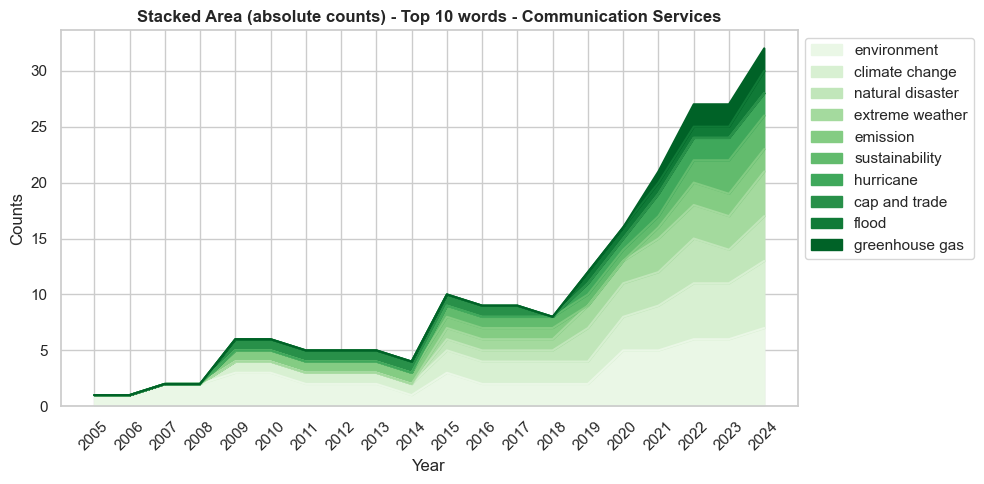

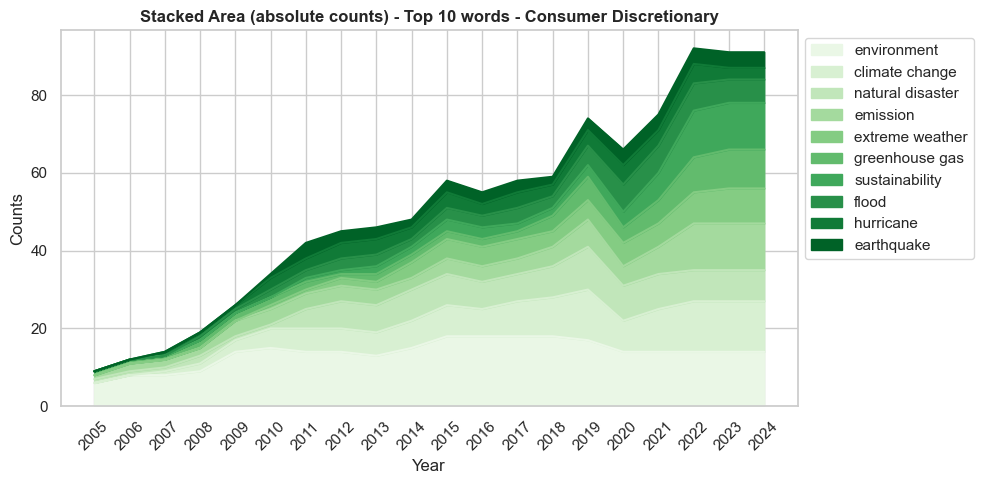

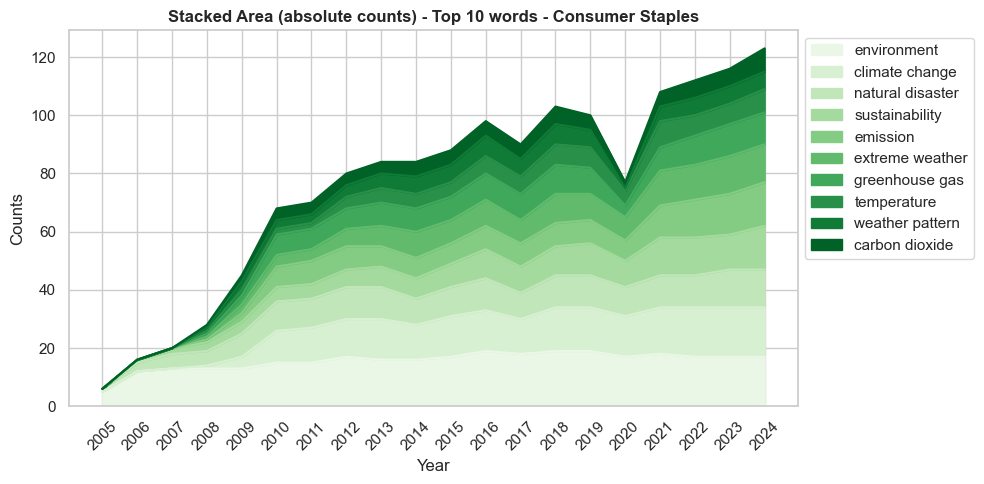

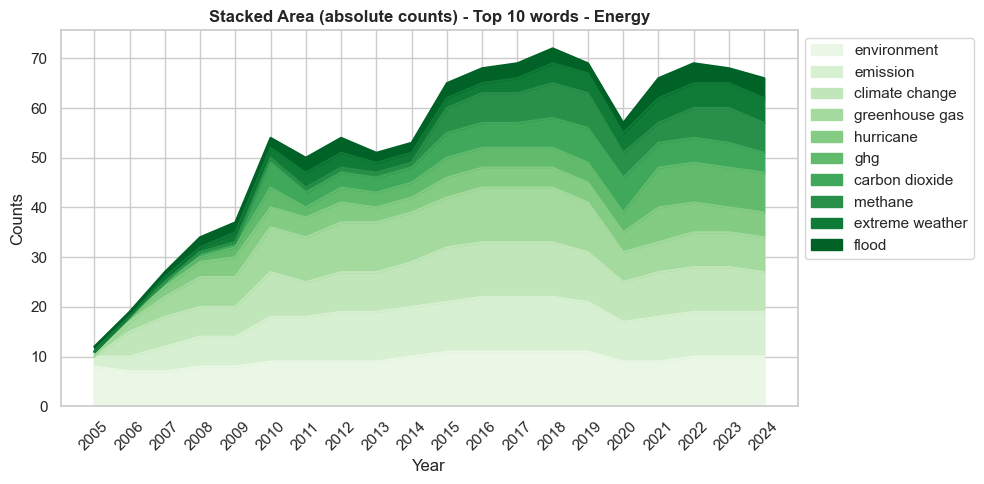

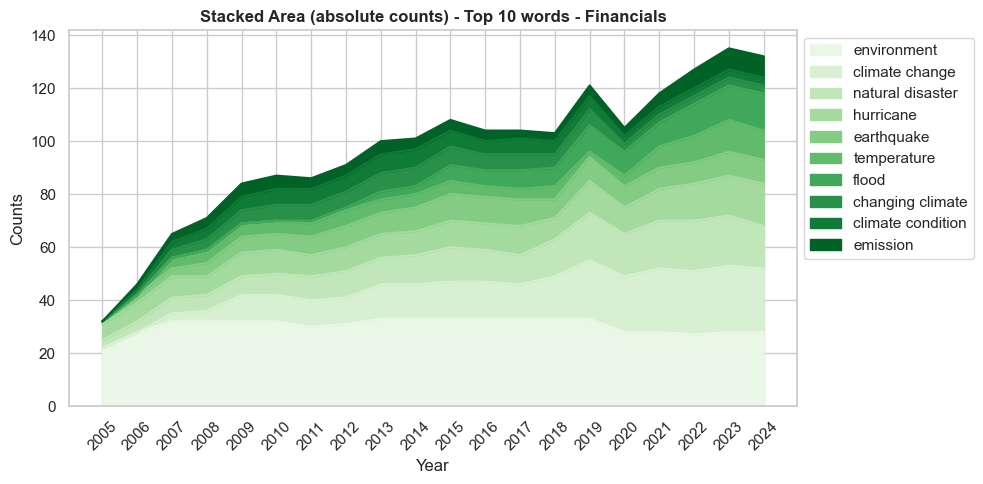

...

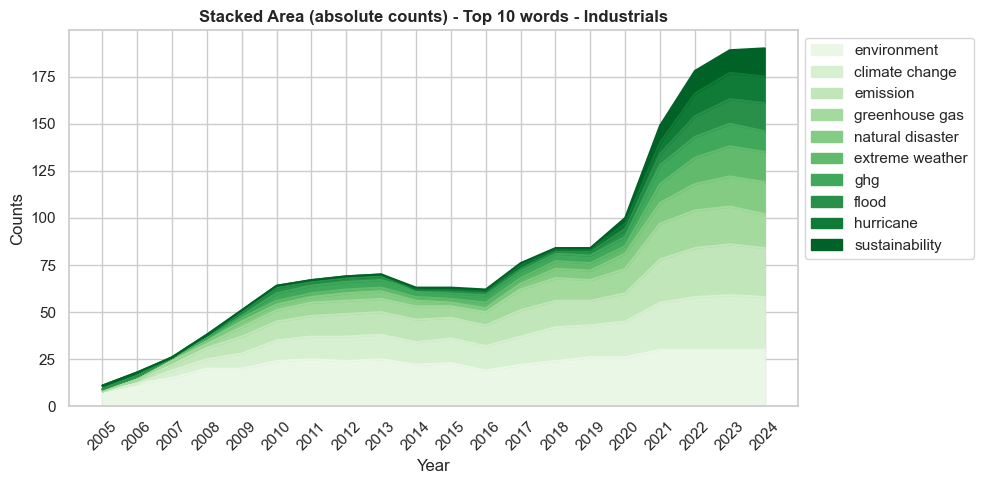

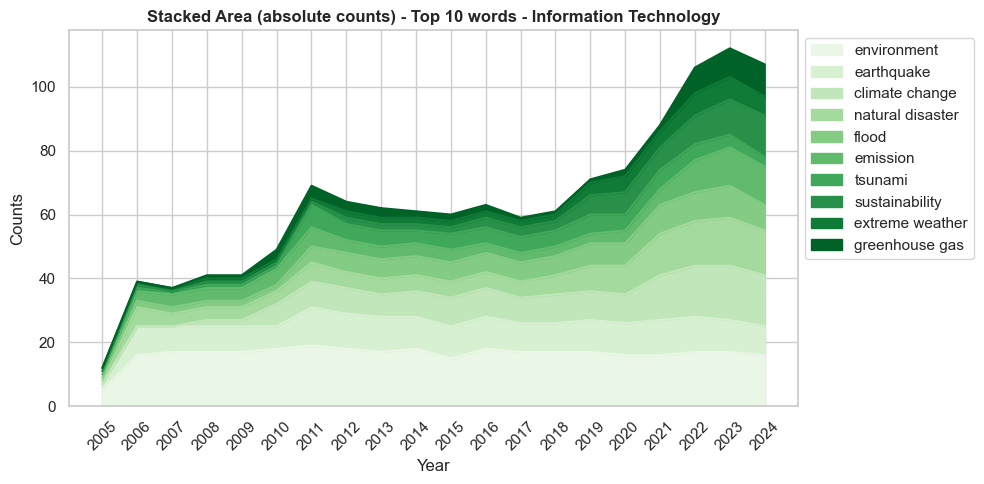

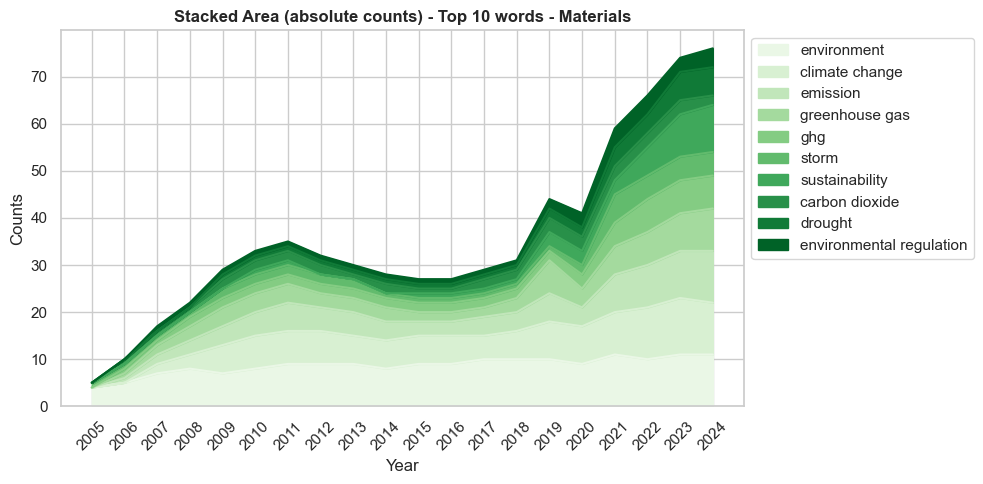

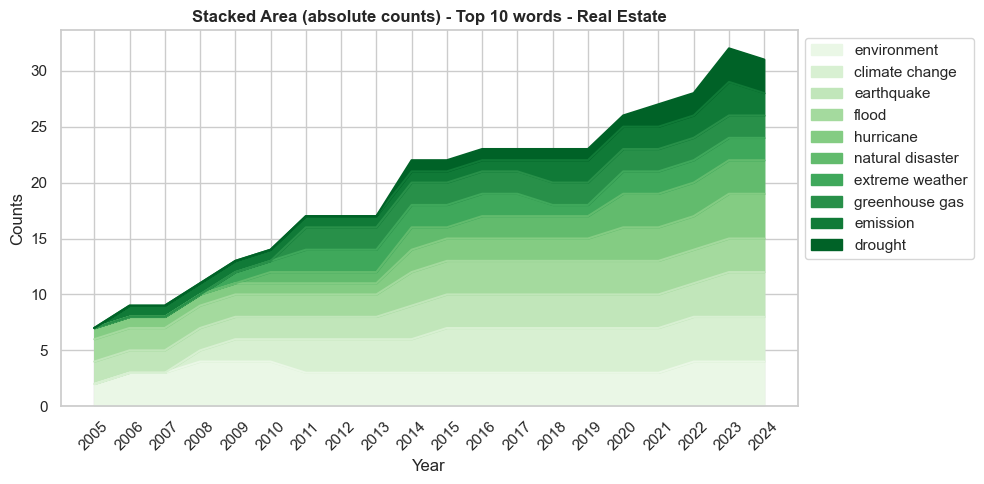

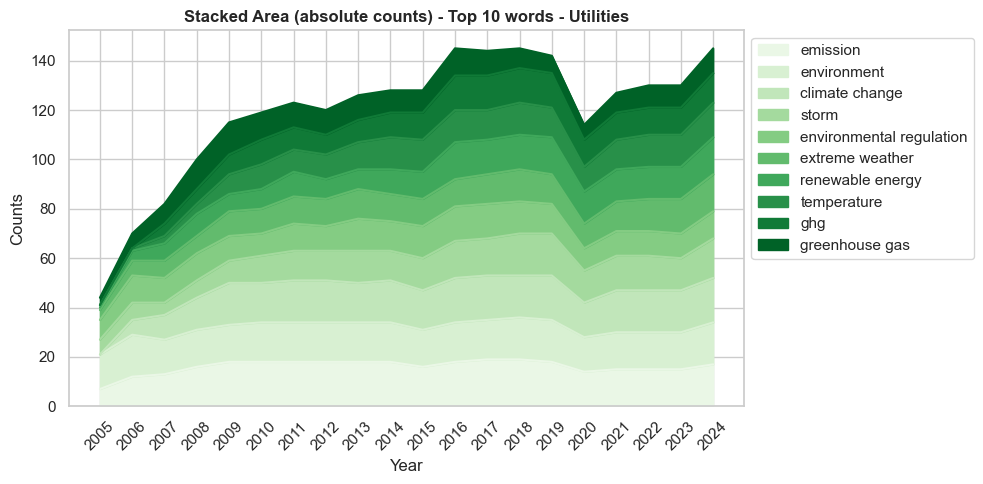

In [36]:
## 1. Polot Stacked Area Plots
# prepare data
data["climate_words_list"] = data["climate_words"].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

# os.makedirs("Plots/Stacked_Area", exist_ok=True)

# Top 10 Words
TOP_N = 10

for sector, df_sec in data.groupby("sector"):
    # get words of top n for sectors over years
    all_words = [w for sublist in df_sec["climate_words_list"] for w in sublist]
    top_words = [w for w,_ in Counter(all_words).most_common(TOP_N)]
    if len(top_words) == 0:
        continue

    # frequencies per year for words as absolute counts
    freqs = {}
    years = sorted(df_sec["FiscalYearEnd"].dropna().unique().astype(int))
    for year in years:
        df_year = df_sec[df_sec["FiscalYearEnd"] == year]
        year_words = [w for sublist in df_year["climate_words_list"] for w in sublist]
        counts = Counter(year_words)
        freqs[year] = {w: counts.get(w, 0) for w in top_words}

    df_plot = pd.DataFrame.from_dict(freqs, orient="index").sort_index().fillna(0)

    # continuous year index (fills missing years with zeros)
    year_index = list(range(df_plot.index.min(), df_plot.index.max() + 1))
    df_plot = df_plot.reindex(year_index, fill_value=0)

    colors = sns.color_palette("Greens", n_colors=len(df_plot.columns))

    ## Absolute stacked area
    sns.set_style("whitegrid")
    plt.figure(figsize=(10,5))
    # area plot
    df_plot.plot.area(ax=plt.gca(), stacked=True, color=colors)
    plt.title(f"Stacked Area (absolute counts) - Top {TOP_N} words - {sector}", fontweight="bold")
    plt.xlabel("Year")
    plt.ylabel("Counts")
    plt.xticks(df_plot.index, rotation=45)
    plt.legend(loc="upper left", bbox_to_anchor=(1,1))
    plt.tight_layout()
    # fname_abs = f"Plots/Stacked_Area/{sector.replace(' ','_')}_stacked_abs.png"
    # plt.savefig(fname_abs, dpi=300, bbox_inches="tight")
    plt.show()


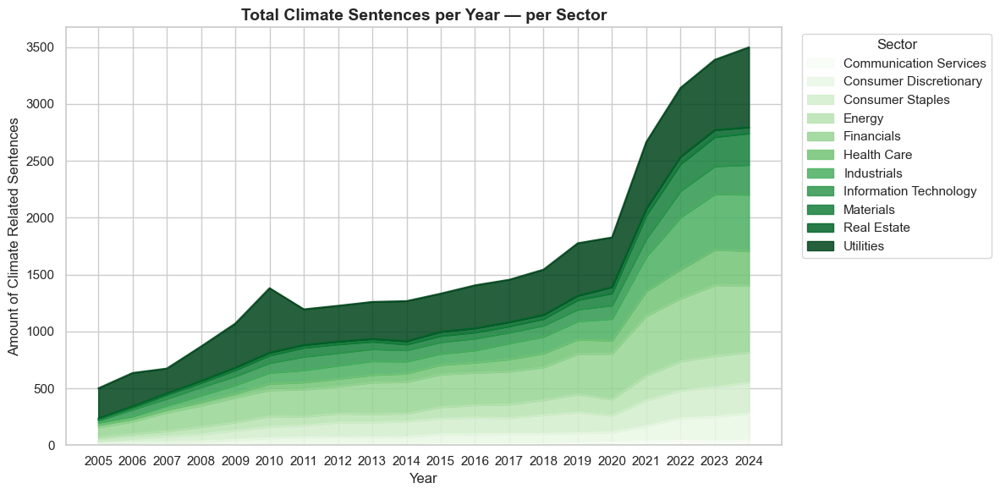

In [37]:
# plot time series analysis for climate sentences count
sns.set_style("whitegrid")
palette = sns.color_palette("Greens", n_colors=len(pivot_sent.columns))
totals = (data.groupby(['FiscalYearEnd','sector'])['climate_sentences_count']
    .sum().reset_index()
    .pivot(index='FiscalYearEnd', columns='sector', values='climate_sentences_count')
    .sort_index().fillna(0))

plt.figure(figsize=(12,6))
totals.plot.area(ax=plt.gca(), stacked=True, colormap="Greens", alpha=0.85)
plt.title('Total Climate Sentences per Year — per Sector', fontsize=14, fontweight='bold')
plt.xlabel('Year', fontsize=12)
plt.ylabel('Amount of Climate Related Sentences', fontsize=12)
plt.legend(title='Sector', bbox_to_anchor=(1.02,1), loc='upper left')
plt.xticks(ticks=totals.index.astype(int), labels=totals.index.astype(int))
plt.tight_layout()
plt.show()


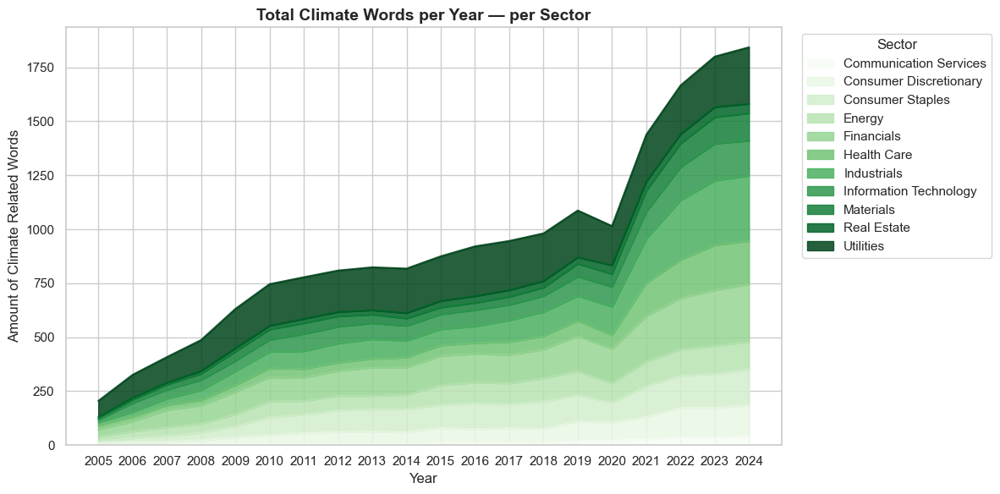

In [38]:
# plot time series analysis for climate sentences count
sns.set_style("whitegrid")
palette = sns.color_palette("Greens", n_colors=len(pivot_sent.columns))

# group by year and sector for sum of climate words count
totals = (data.groupby(['FiscalYearEnd','sector'])['climate_words_count']
    .sum()
    .reset_index()
    .pivot(index='FiscalYearEnd', columns='sector', values='climate_words_count').sort_index().fillna(0))
# Plot stacked area
plt.figure(figsize=(12,6))
totals.plot.area(ax=plt.gca(), stacked=True, colormap="Greens", alpha=0.85)
plt.title('Total Climate Words per Year — per Sector', fontsize=14, fontweight='bold')
plt.xlabel('Year', fontsize=12)
plt.ylabel('Amount of Climate Related Words', fontsize=12)
plt.legend(title='Sector', bbox_to_anchor=(1.02,1), loc='upper left')
# whole integers
plt.xticks(ticks=totals.index.astype(int), labels=totals.index.astype(int))
plt.tight_layout()
plt.show()


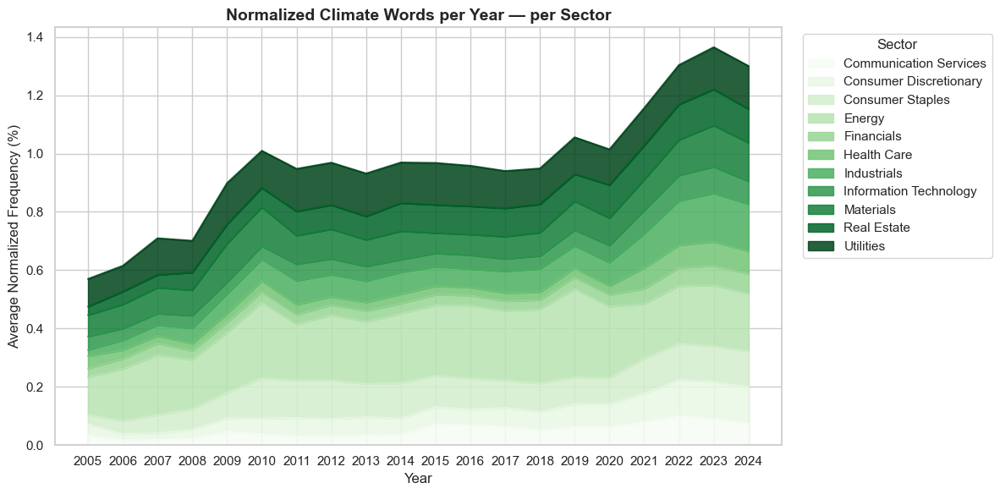

In [39]:
# group by sector and year, calculate mean of normalized climate words
heatmap_data = data.groupby(['FiscalYearEnd','sector'])['climate_words_normalized'].mean().reset_index()

#calculate percent out of normalized words
heatmap_data['climate_percent'] = heatmap_data['climate_words_normalized'] * 100

# Pivot
pivot_percent = heatmap_data.pivot(index='FiscalYearEnd', columns='sector', values='climate_percent').fillna(0)

# Plot
plt.figure(figsize=(12,6))
pivot_percent.plot.area(ax=plt.gca(), stacked=True, colormap='Greens', alpha=0.85)
plt.title('Normalized Climate Words per Year — per Sector', fontsize=14, fontweight='bold')
plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Normalized Frequency (%)', fontsize=12)
plt.legend(title='Sector', bbox_to_anchor=(1.02,1), loc='upper left')
# whole integer
plt.xticks(ticks=pivot_percent.index.astype(int), labels=pivot_percent.index.astype(int))

plt.tight_layout()
plt.show()


#### 2. Preliminary Analysis

##### 2.1. Word Cloud Analysis

In [40]:
# get nltk
nltk.download('punkt')
nltk.download('stopwords')
# flatten list
flat_list = [x for i in data["climate_sentences"] for x in i]

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\rober\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rober\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


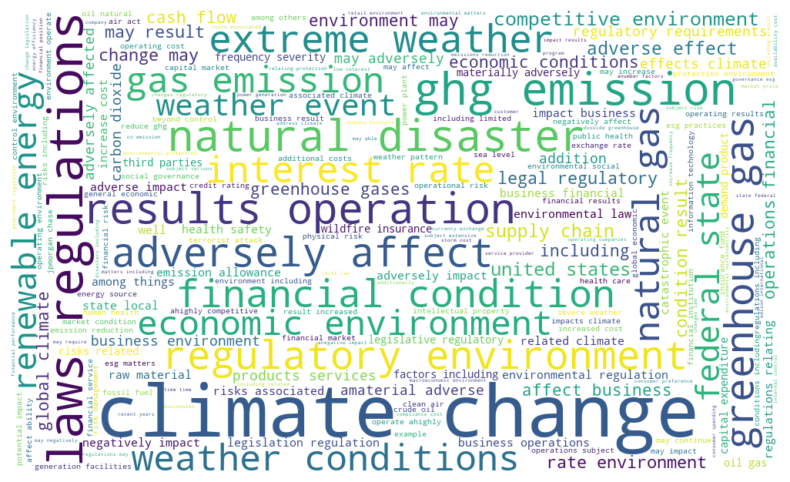

['cap and trade', 'carbon dioxide', 'carbon tax', 'changing climate', 'clean air act', 'climate change', 'climate condition', 'climate control', 'climate initiative', 'climate legislation', 'climate regulation', 'climate risk', 'co2', 'drought', 'earthquake', 'emission', 'emission standard', 'environment', 'environmental regulation', 'esg', 'eu ets', 'extreme temperature', 'extreme weather', 'flood', 'ghg', 'global warming', 'greenhouse gas', 'hurricane', 'indirect effect', 'kyoto protocol', 'methane', 'natural disaster', 'physical risk from climate change', 'reduction of emission', 'regulation related to climate change', 'renewable energy', 'rising temperature', 'sea level', 'storm', 'sustainability', 'tailoring rule', 'temperature', 'title v', 'tsunami', 'united nations framework convention on climate change', 'unusual weather', 'warm weather', 'warmer weather', 'warming', 'weather pattern', 'wildfire']
List of different climate related words: 51
[('environment', 3166), ('climate cha

C:\Users\rober\AppData\Local\Temp\ipykernel_11432\344511726.py:54: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_top20, x='count', y='word', palette=palette)
C:\Users\rober\AppData\Local\Temp\ipykernel_11432\344511726.py:54: UserWarning: The palette list has more values (30) than needed (20), which may not be intended.
  sns.barplot(data=df_top20, x='count', y='word', palette=palette)


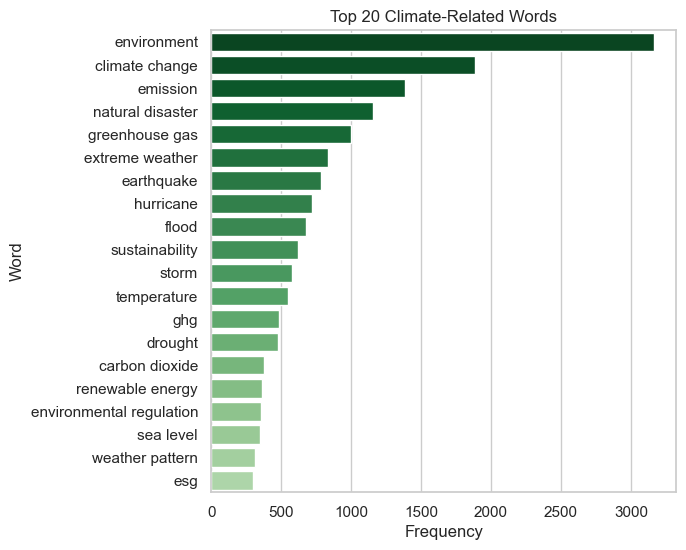

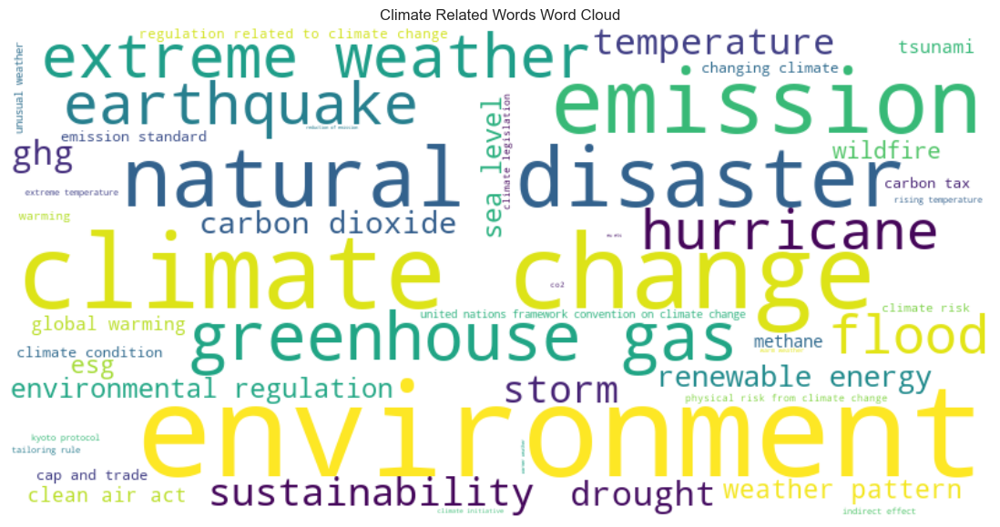

In [41]:
## 1. Stopwords handling
# english stopwordss and tokenization
stop_words = set(stopwords.words("english"))

# remove stopwords
tokens = []
for sentence in flat_list:
    words = word_tokenize(sentence.lower())
    filtered_tokens = [x for x in words if x.isalpha() and x not in stop_words]
    tokens.extend(filtered_tokens)

## 2. wordcloud
# tokens to string
text = " ".join(tokens)

wordcloud = WordCloud(width=1000, height=600, background_color="white", colormap="viridis").generate(text)
plt.figure(figsize=(12,6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()


## Word cloud for extracted climate related words

#prepare data
data["climate_words_list"] = data["climate_words"].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
# take all climate related words
all_climate_words = [word for sublist in data["climate_words_list"] for word in sublist]

# filter unique words
unique_climate_words = sorted(set(all_climate_words))

print(unique_climate_words)
print(f"List of different climate related words: {len(unique_climate_words)}")

# count the frequencies of climate related words
word_counts = Counter(all_climate_words)

#show 20 most frequent words
print(word_counts.most_common(20))

# Convert Counter to DataFrame
df_counts = pd.DataFrame(word_counts.items(), columns=['word', 'count'])

# Top 20 words, better for visuality
df_top20 = df_counts.sort_values(by='count', ascending=False).head(20)

sns.set_style("whitegrid")
# reverse the color palette
palette = sns.color_palette("Greens", n_colors=30)[::-1]
# Plot barplot for frequencies with seaborn
plt.figure(figsize=(6,6))
sns.barplot(data=df_top20, x='count', y='word', palette=palette)
plt.title("Top 20 Climate-Related Words")
plt.xlabel("Frequency")
plt.ylabel("Word")
plt.show()

# Create a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white')\
    .generate_from_frequencies(word_counts)

# Plot the word cloud
plt.figure(figsize=(15, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Climate Related Words Word Cloud")
plt.show()

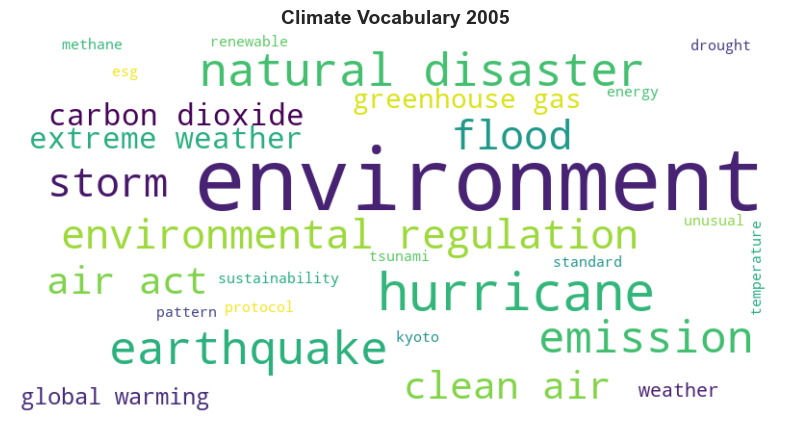

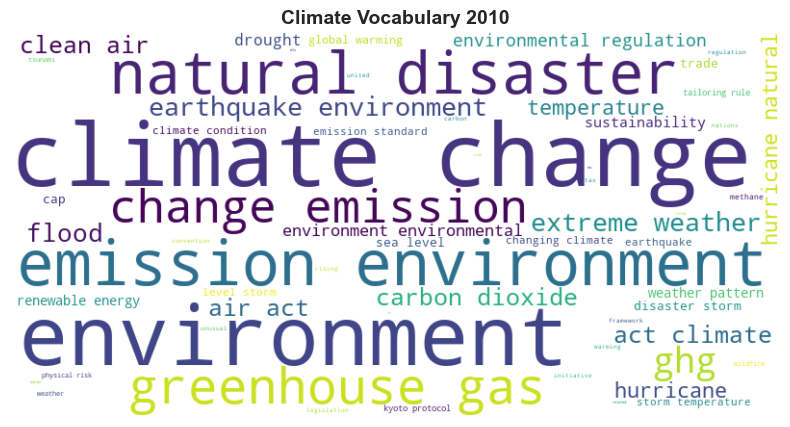

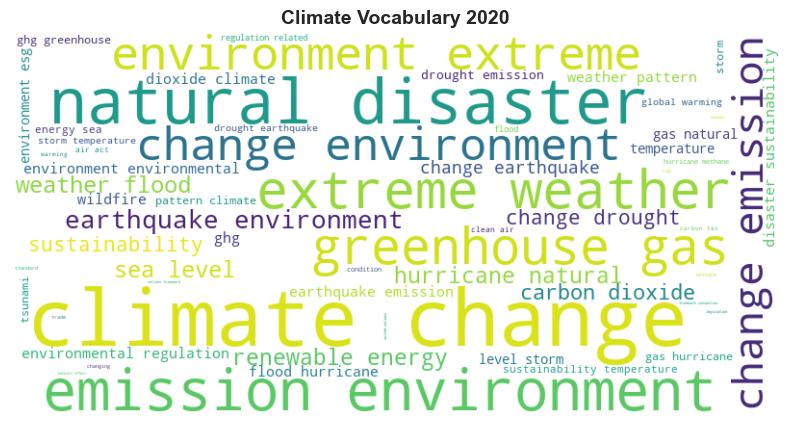

In [42]:
# convert to python list
data['climate_words'] = data['climate_words'].apply(lambda x: eval(x) if isinstance(x, str) else x)

# Group by year
grouped = data.groupby("FiscalYearEnd")['climate_words'].sum()

# Word Clouds for example years
for year in [2005, 2010, 2020]:
    if year in grouped.index:
        words = " ".join(grouped.loc[year])
        wc = WordCloud(width=800, height=400, background_color="white").generate(words)

        plt.figure(figsize=(10,5))
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.title(f"Climate Vocabulary {year}", fontsize=14, fontweight="bold")
        plt.show()

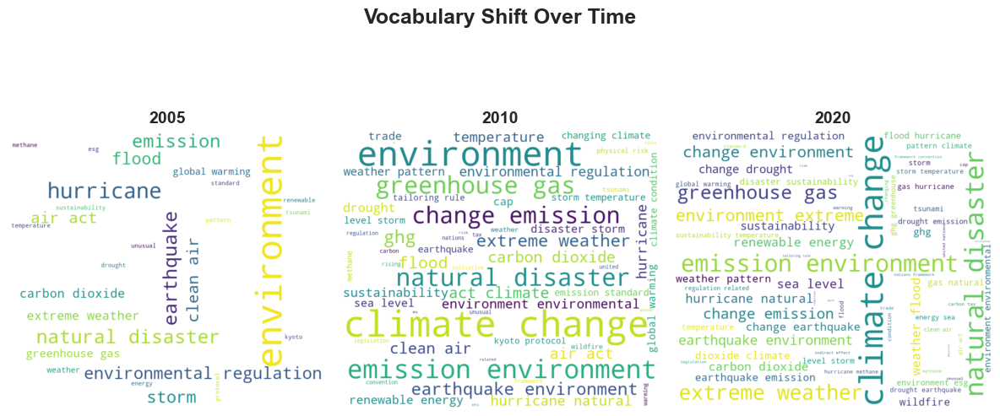

In [43]:
## Word Cloud Shift
# Years of interest
years = [2005, 2010, 2020]

fig, axes = plt.subplots(1, len(years), figsize=(12,6))

# plot wordclouds next to each other for better comparison
for i, year in enumerate(years):
    if year in grouped.index:
        words = " ".join(grouped.loc[year])
        wc = WordCloud(width=800, height=700, background_color="white").generate(words)
        axes[i].imshow(wc, interpolation="bilinear")
        axes[i].axis("off")
        axes[i].set_title(f"{year}", fontsize=14, fontweight="bold")

plt.suptitle("Vocabulary Shift Over Time", fontsize=18, fontweight="bold")
plt.tight_layout()
plt.savefig("Word Cloud Vocabulary Shift.png")
plt.show()

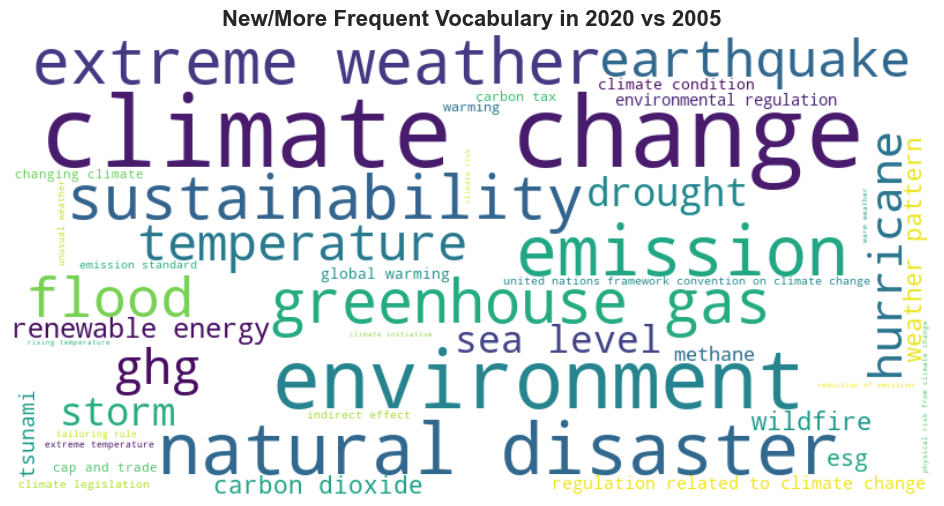

In [44]:
## Make differences between vocabulary shift clear for 2005 vs. 2020
# counts per year
counts_2005 = Counter(grouped.loc[2005])
counts_2020 = Counter(grouped.loc[2020])

# difference, words which are more frequent in 2020 than 2005
diff_counts = {word: counts_2020[word] - counts_2005.get(word, 0) 
               for word in counts_2020 if counts_2020[word] > counts_2005.get(word, 0)}

wc = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(diff_counts)

plt.figure(figsize=(12,6))
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")
plt.title("New/More Frequent Vocabulary in 2020 vs 2005", fontsize=16, fontweight="bold")
plt.savefig("More Frequent Words 2020 vs 2005.png")
plt.show()

##### 2.2. Within Sector Trends

<Figure size 1200x600 with 0 Axes>

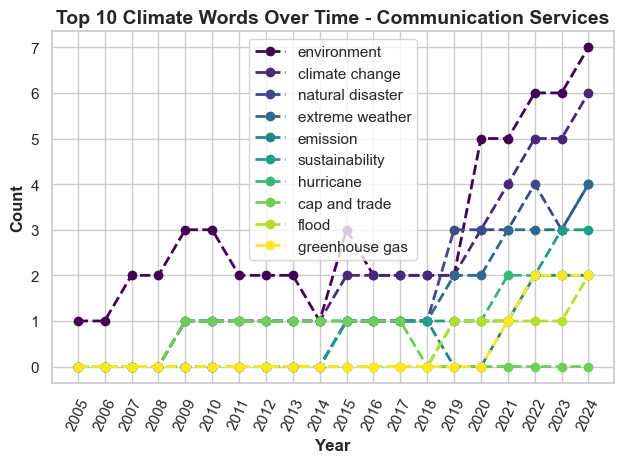

<Figure size 1200x600 with 0 Axes>

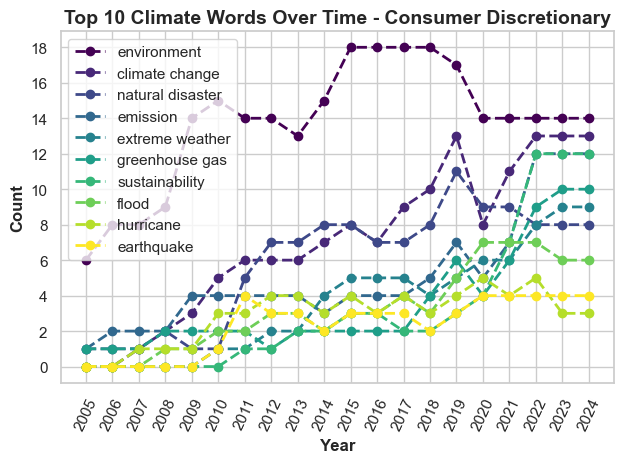

<Figure size 1200x600 with 0 Axes>

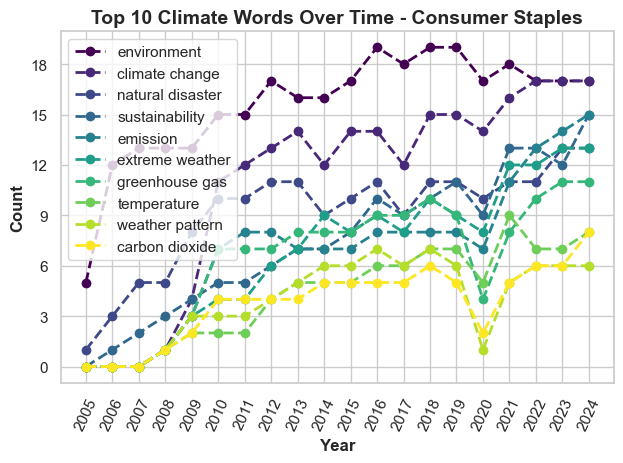

<Figure size 1200x600 with 0 Axes>

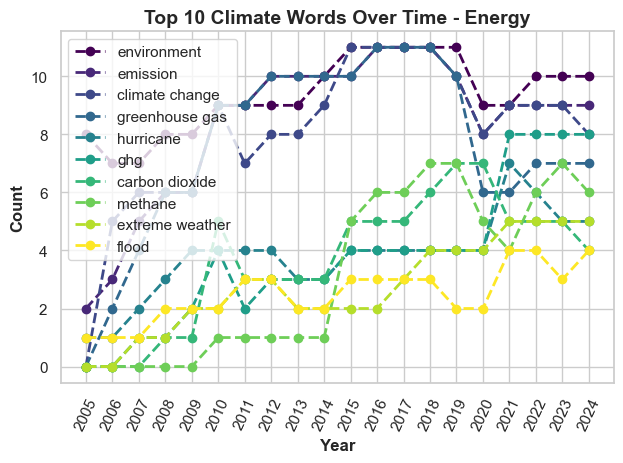

<Figure size 1200x600 with 0 Axes>

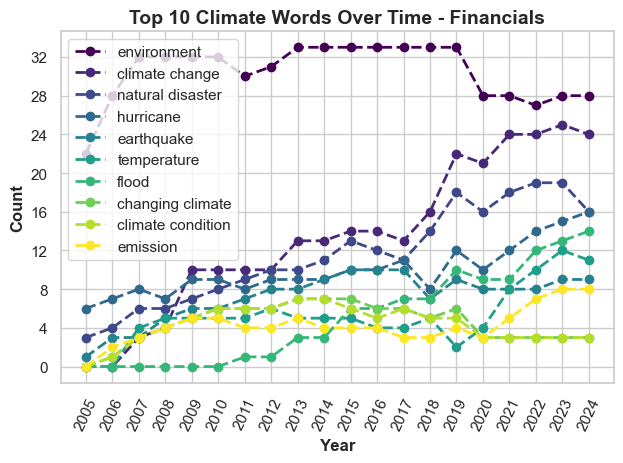

<Figure size 1200x600 with 0 Axes>

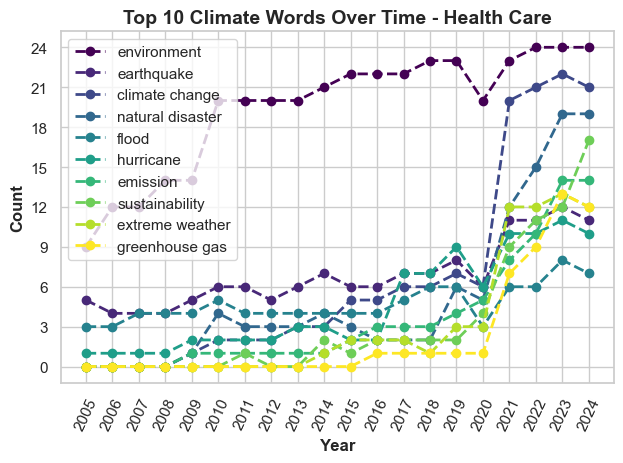

<Figure size 1200x600 with 0 Axes>

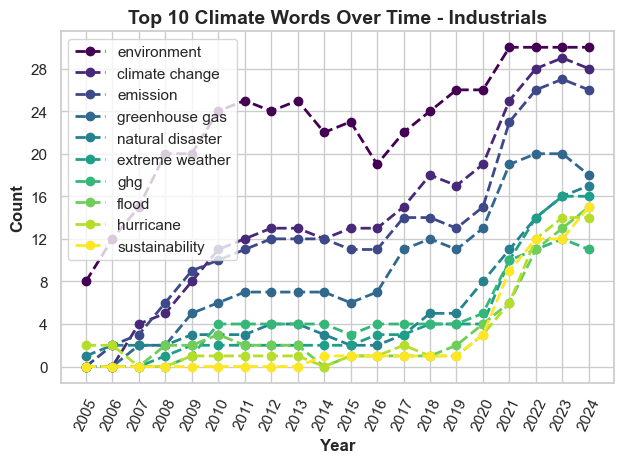

<Figure size 1200x600 with 0 Axes>

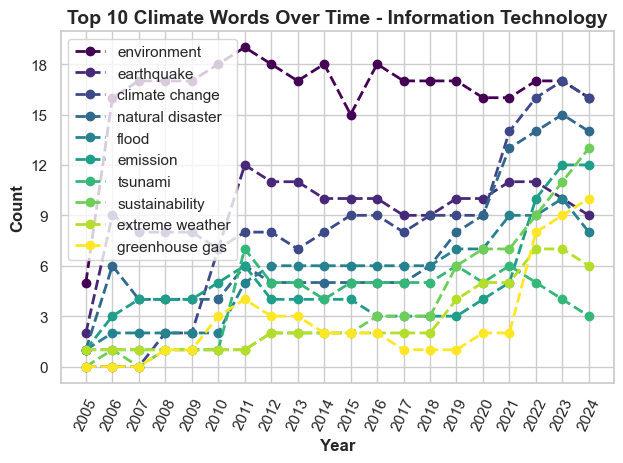

<Figure size 1200x600 with 0 Axes>

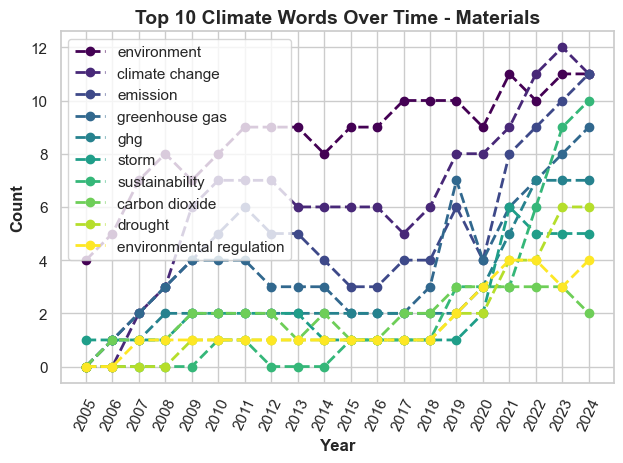

<Figure size 1200x600 with 0 Axes>

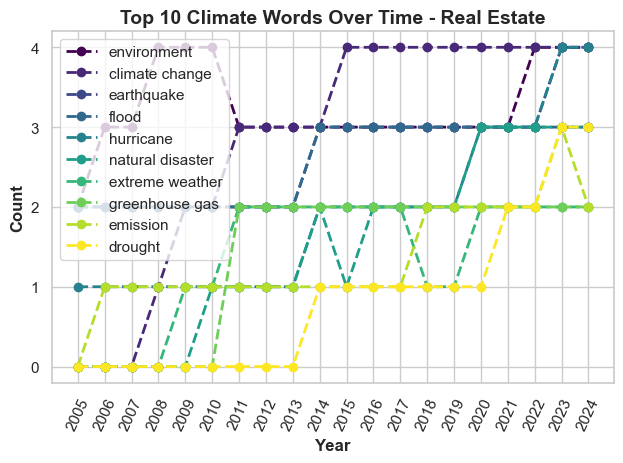

<Figure size 1200x600 with 0 Axes>

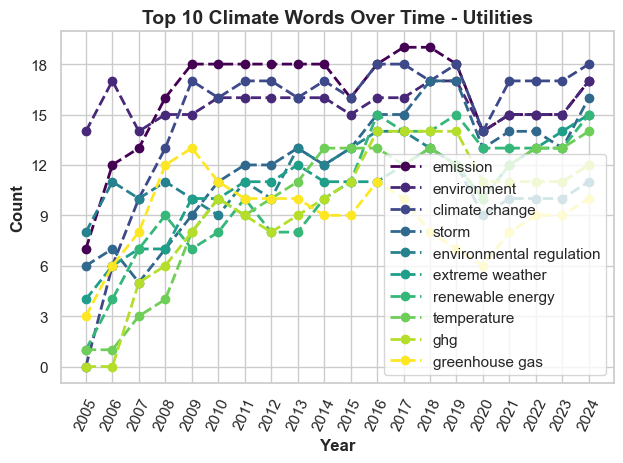

In [45]:
## 1. Plot ten most common climate related words for every sector

# prepare climate list
data["climate_words_list"] = data["climate_words"].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

#get 10 most common words
for sector, df_sec in data.groupby("sector"):
    #collect all words then filter
    all_words = [w for sublist in df_sec["climate_words_list"] for w in sublist]
    top_words = [w for w, _ in Counter(all_words).most_common(10)]
    
    #count frequencies for these words
    freqs = {}
    for year, df_year in df_sec.groupby("FiscalYearEnd"):
        year_words = [w for sublist in df_year["climate_words_list"] for w in sublist]
        counts = Counter(year_words)
        freqs[year] = {w: counts[w] for w in top_words}
    
    #setup dataframe and adjust index as beforehand was floating year numbers
    df_plot = pd.DataFrame.from_dict(freqs, orient="index").fillna(0)
    df_plot.index = df_plot.index.astype(int)
    # Plot the lineplots for every sector
    sns.set_style("whitegrid")
    plt.figure(figsize=(12,6))
    df_plot.plot(marker="o", linestyle="--", linewidth=2, colormap="viridis")
    plt.title(f"Top 10 Climate Words Over Time - {sector}", fontsize=14, fontweight="bold")
    plt.ylabel("Count", fontweight="semibold")
    plt.xlabel("Year", fontweight="semibold")
    plt.xticks(df_plot.index, rotation=65)
    # whole integer as tickers
    plt.gca().yaxis.set_major_locator(mticker.MaxNLocator(integer=True))
    plt.tight_layout()
    plt.show()


<Figure size 600x600 with 0 Axes>

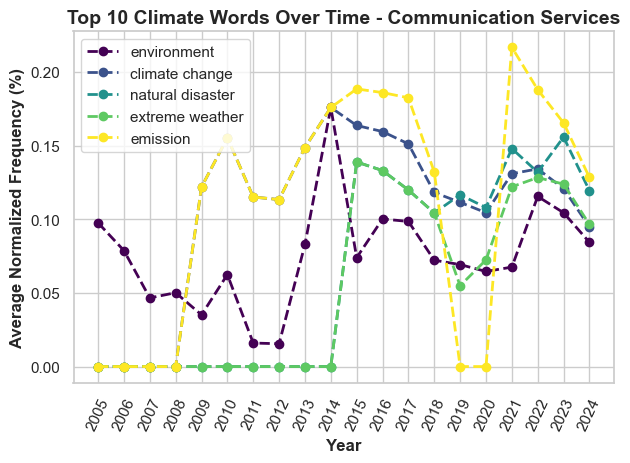

<Figure size 600x600 with 0 Axes>

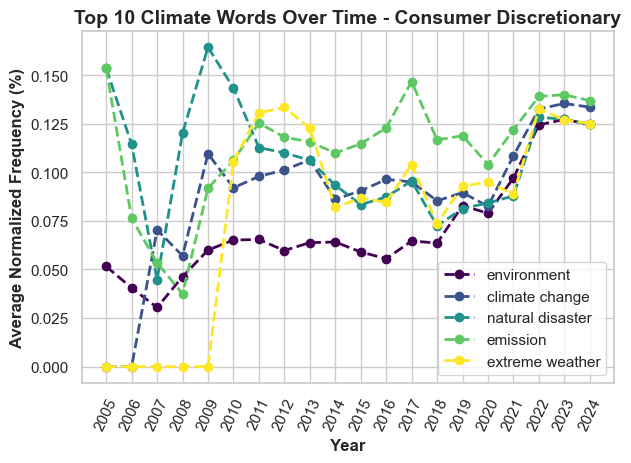

<Figure size 600x600 with 0 Axes>

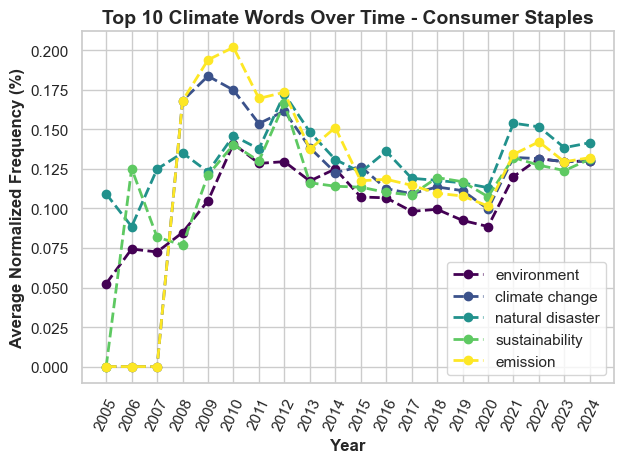

<Figure size 600x600 with 0 Axes>

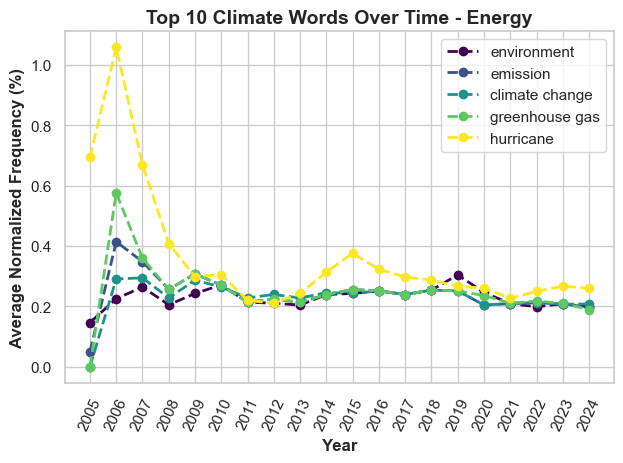

<Figure size 600x600 with 0 Axes>

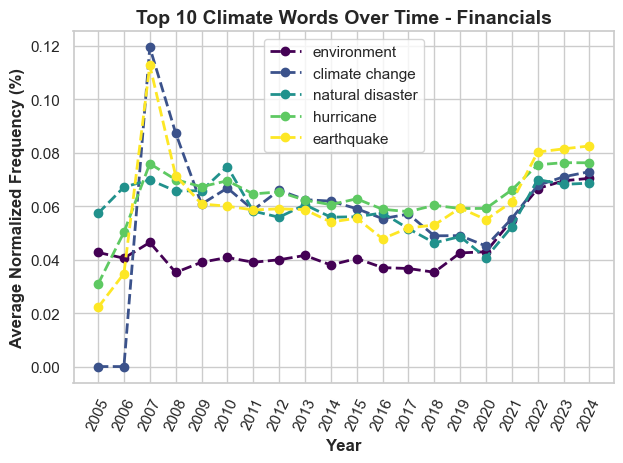

<Figure size 600x600 with 0 Axes>

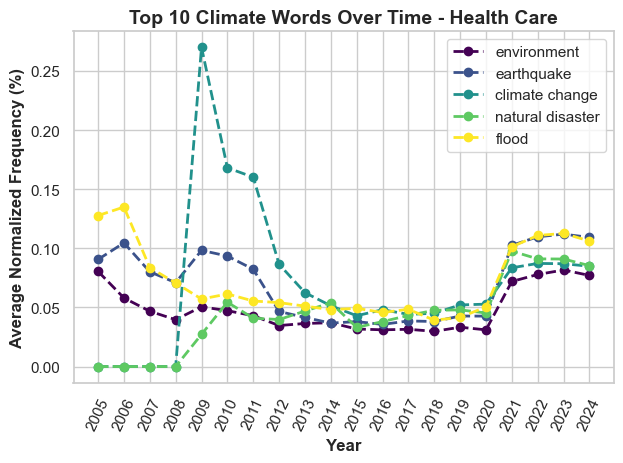

<Figure size 600x600 with 0 Axes>

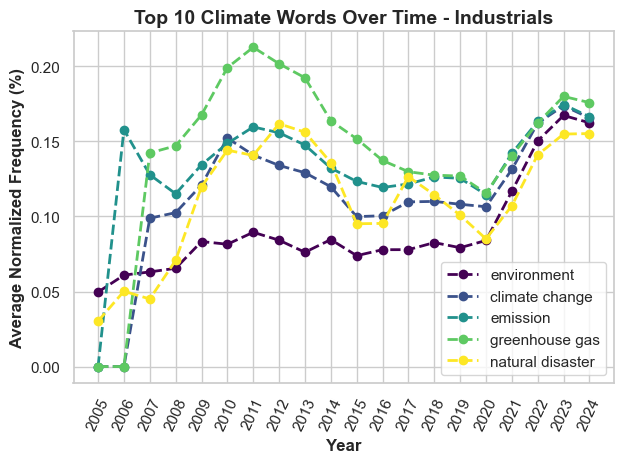

<Figure size 600x600 with 0 Axes>

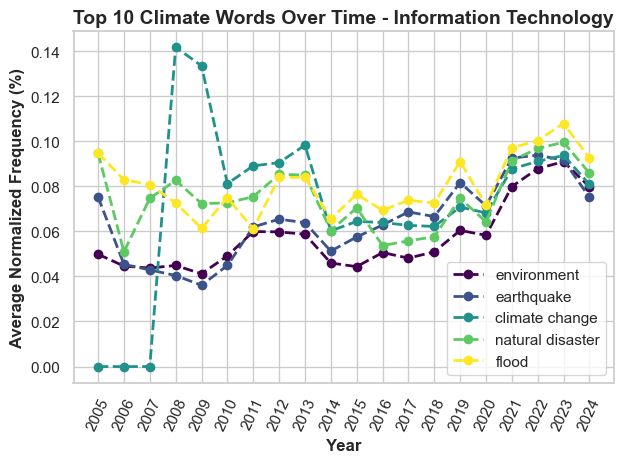

<Figure size 600x600 with 0 Axes>

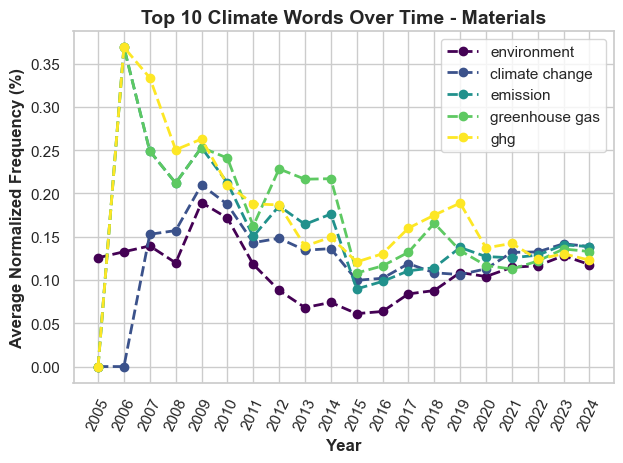

<Figure size 600x600 with 0 Axes>

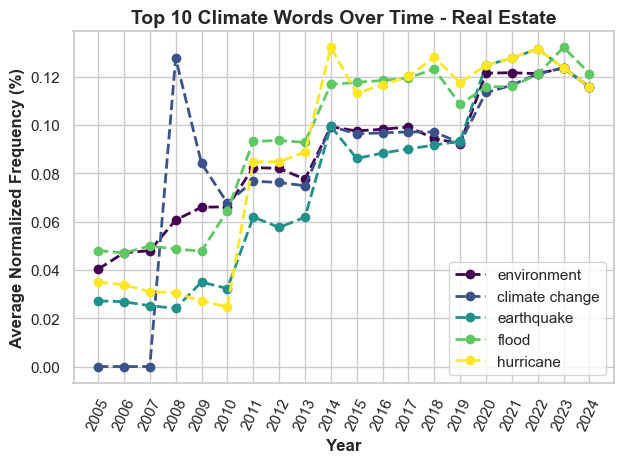

<Figure size 600x600 with 0 Axes>

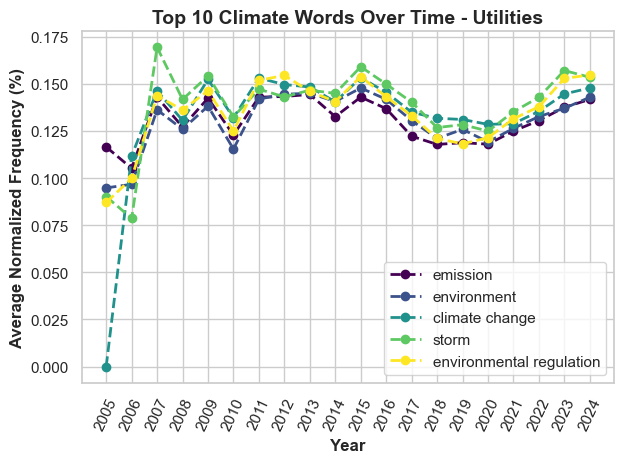

In [46]:
## Top 5 Climate Words per Sector (normalized by using climate_words_normalized)

# prepare columns
data["climate_words_list"] = data["climate_words"].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

os.makedirs("Plots/Sector_Word_Trends", exist_ok=True)

#iterate over sectors and filter words
for sector, df_sec in data.groupby("sector"):
    all_words = [w for sublist in df_sec["climate_words_list"] for w in sublist]
    top_words = [w for w, _ in Counter(all_words).most_common(5)]
    
    #setup counting for frequencies
    freqs = {}
    for year, df_year in df_sec.groupby("FiscalYearEnd"):
        # amount of normalized climate words
        year_words = [w for sublist in df_year["climate_words_list"] for w in sublist]
        counts = Counter(year_words)
        
        #create normalized metric in percent
        #mean for all years and sectors
        counts_norm = {}
        for w in top_words:
            mask = df_year["climate_words_list"].apply(lambda lst: w in lst)
            counts_norm[w] = df_year.loc[mask, "climate_words_normalized"].mean()* 100 if mask.any() else 0
        
        freqs[year] = counts_norm
    
    # df setup
    df_plot = pd.DataFrame.from_dict(freqs, orient="index").fillna(0)
    df_plot.index = df_plot.index.astype(int)
    

    # Plot lineplots
    sns.set_style("whitegrid")
    plt.figure(figsize=(6,6))
    df_plot.plot(marker="o", linestyle="--", linewidth=2, colormap="viridis")
    plt.title(f"Top 10 Climate Words Over Time - {sector}", fontsize=14, fontweight="bold")
    plt.ylabel("Average Normalized Frequency (%)", fontweight="semibold")
    plt.xlabel("Year", fontweight="semibold")
    plt.xticks(df_plot.index, rotation=65)
    plt.tight_layout()
    filename = f"Plots/Sector_Word_Trends/Top_5_Climate_Words_{sector.replace(' ','_')}.png"
    plt.savefig(filename)
    plt.show()


### 3. Climate Event Timeline & Time Series Analysis (Sarimax)

In [47]:
## load climate event timline
events = pd.read_excel("Events.xlsx")
# get rid of appendices in the df
events = events.iloc[:-3]
events

,Date,Event,Description,In_usa
0,2004-09-21 00:00:00,Hurricane Ivan,Cyclone - 34 bio$ damage - 57 dead,1.0
1,2005-08-30 00:00:00,Hurricane Katrina,Cyclone - 201 bio$ - 1.833 dead,1.0
2,2005-10-08 00:00:00,Kashmir Earthquake,86k casualties,0.0
3,2007-11-16 00:00:00,Cyclone Sidr,15k casualties,0.0
4,2008-05-03 00:00:00,Cyclone Nargis,Myanmar 180k casualties,0.0
5,2008-09-14 00:00:00,Hurricane Ive,Cyclone - 43 bio$ - 112 dead,1.0
6,2010-01-12 00:00:00,Earthquake Haiti,100k casualties,0.0
7,2011-03-11 00:00:00,Tsunami and Earthquake Japan,19k casualties,0.0
8,2012-10-31 00:00:00,Hurricane Sandy,Cyclone - 88 bio$ - 159 dead,1.0
9,2017-09-14 00:00:00,Hurricanes US,Series of Cyclones - 339 bio$ - 3140 deaths,1.0


In [48]:
## Create dummies

# prepare events dataframe
events['Date'] = pd.to_datetime(events['Date'])
# filter events beginnign with 2005
events_filtered = events[events['Date'].dt.year >= 2005]
events = events_filtered

events['Year'] = events['Date'].dt.year

#rename for convenience
data['Year'] = data['FiscalYearEnd']

#sort all years in the dataset 
all_years = sorted(data['FiscalYearEnd'].unique())
print("all years in data:", all_years)

#prepare year data of events df
event_years = events['Year'].tolist()
print("event years:", event_years)

#match event dummies for evera year
event_dummies = pd.DataFrame({'Year': all_years})
event_dummies


all years in data: [np.int32(2005), np.int32(2006), np.int32(2007), np.int32(2008), np.int32(2009), np.int32(2010), np.int32(2011), np.int32(2012), np.int32(2013), np.int32(2014), np.int32(2015), np.int32(2016), np.int32(2017), np.int32(2018), np.int32(2019), np.int32(2020), np.int32(2021), np.int32(2022), np.int32(2023), np.int32(2024)]
event years: [2005, 2005, 2007, 2008, 2008, 2010, 2011, 2012, 2017, 2018, 2018, 2021, 2021, 2022, 2023, 2024]


C:\Users\rober\AppData\Local\Temp\ipykernel_11432\1615767670.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  events['Year'] = events['Date'].dt.year


,Year
0,2005
1,2006
2,2007
3,2008
4,2009
5,2010
6,2011
7,2012
8,2013
9,2014


In [49]:
#Dummy for every year in events years
event_dummies['event_dummy'] = event_dummies['Year'].isin(event_years).astype(int)

#dummies for every year before and after an event
event_dummies['event_before'] = event_dummies['Year'].isin([y-1 for y in event_years]).astype(int)
event_dummies['event_after'] = event_dummies['Year'].isin([y+1 for y in event_years]).astype(int)

#print years which are connected with events
print("Event Dummies:")
print(event_dummies[event_dummies['event_dummy'] == 1])

Event Dummies:
    Year  event_dummy  event_before  event_after
0   2005            1             0            0
2   2007            1             1            0
3   2008            1             0            1
5   2010            1             1            0
6   2011            1             1            1
7   2012            1             0            1
12  2017            1             1            0
13  2018            1             0            1
16  2021            1             1            0
17  2022            1             1            1
18  2023            1             1            1
19  2024            1             0            1


In [50]:
## 2: Fixed Effects Regression

# merge data with event dummies
regression_data = data.merge(event_dummies, left_on='FiscalYearEnd', right_on='Year', how='left')

# fill missing dummies with 0
regression_data[['event_dummy', 'event_before', 'event_after']] = regression_data[['event_dummy', 'event_before', 'event_after']].fillna(0)

print("Daten Shape:", regression_data.shape)
print("Event Dummy Summe:", regression_data['event_dummy'].sum())

# Fixed Effects - create dummie sof corporations
companies = pd.get_dummies(regression_data['cik'], prefix='company')
print("amount of corporations:", companies.shape[1])

# year as numeric variable
regression_data['year_numeric'] = regression_data['FiscalYearEnd'] - 2005

# X Matrix 
X = pd.concat([
    regression_data[['year_numeric', 'event_dummy', 'event_before', 'event_after']],
    companies.iloc[:, :-1]  # all corporations besides last one which is reference
], axis=1)

# Y Variable
y = regression_data['climate_sentences_normalized']


# make sure X, y only contains numerics
X = X.astype(float)

y = y.astype(float)
# Regression
model = LinearRegression()
model.fit(X, y)

# Show results
print("\n=== FIXED EFFECTS REGRESSION  ===")
print(f"R-squared: {model.score(X, y):.4f}")
print(f"Intercept: {model.coef_[0]:.6f}")
print(f"Jahr Trend: {model.coef_[0]:.6f}")
print(f"Event Jahr Effekt: {model.coef_[1]:.6f}")
print(f"Jahr vor Event Effekt: {model.coef_[2]:.6f}")  
print(f"Jahr nach Event Effekt: {model.coef_[3]:.6f}")

# t-test for event effects
n_obs = len(y)
residuals = y - model.predict(X)
mse = np.sum(residuals**2) / (n_obs - X.shape[1])
se_event = np.sqrt(mse * np.linalg.inv(X.T @ X)[1, 1])
t_stat_event = model.coef_[1] / se_event
print(f"Event effetc t-Statistics: {t_stat_event:.3f}")

if abs(t_stat_event) > 1.96:
    print("event effect ist statistically signififcant (p < 0.05)")
else:
    print("event effect is not significant")

Daten Shape: (3846, 23)
Event Dummy Summe: 2271
amount of corporations: 215

=== FIXED EFFECTS REGRESSION  ===
R-squared: 0.6960
Intercept: 0.001732
Jahr Trend: 0.001732
Event Jahr Effekt: 0.005398
Jahr vor Event Effekt: 0.004186
Jahr nach Event Effekt: 0.004896
Event effetc t-Statistics: 8.848
event effect ist statistically signififcant (p < 0.05)


time series data:

=== SARIMAX MODEL ===
SARIMAX Results:
                                    SARIMAX Results                                     
Dep. Variable:     climate_sentences_normalized   No. Observations:                   20
Model:                         SARIMAX(1, 1, 1)   Log Likelihood                  82.963
Date:                          Sun, 31 Aug 2025   AIC                           -153.925
Time:                                  16:25:50   BIC                           -148.259
Sample:                                       0   HQIC                          -152.966
                                           - 20                                         
Covariance Type:                            opg                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
event_before     0.0008      0.002      0.422      0.673      -0.003

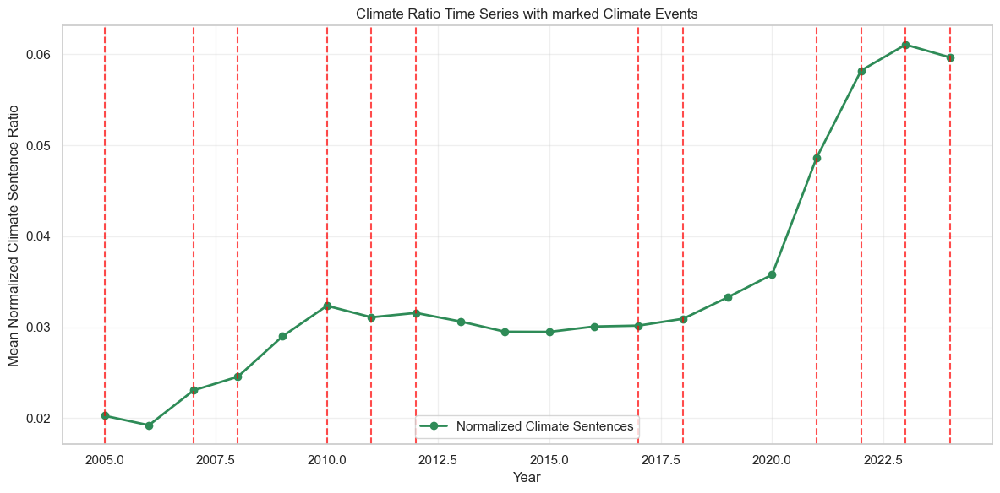

In [51]:
## SARIMAX Analysis
# create time series for sample with mean aggregate for year
time_series_data = regression_data.groupby('FiscalYearEnd').agg({
    'climate_sentences_normalized': 'mean','event_dummy': 'first',
    'event_before': 'first', 'event_after': 'first'}).reset_index()

print("time series data:")
#print(time_series_data.head())

# SARIMAX Model
#Arima mordel with event dummies as exogenous variables
exog_vars = time_series_data[['event_before', 'event_dummy', 'event_after']]
ts = time_series_data['climate_sentences_normalized']

print("\n=== SARIMAX MODEL ===")

# SARIMAX Model fit
# no seasonality, lead to problems
model_sarimax = SARIMAX(ts, 
                       exog=exog_vars,
                       order=(1, 1, 1),  # ARIMA(1,1,1)
                       seasonal_order=(0, 0, 0, 0))

results = model_sarimax.fit(disp=False)

print("SARIMAX Results:")
print(results.summary())

#Extract potential event effects
event_effects = results.params[['event_before', 'event_dummy', 'event_after']]
print("\n=== Event Effects ===")
for var, effect in event_effects.items():
    pvalue = results.pvalues[var]
    significance = "***" if pvalue < 0.001 else "**" if pvalue < 0.01 else "*" if pvalue < 0.05 else ""
    print(f"{var}: {effect:.6f} (p-value: {pvalue:.4f}) {significance}")

#Show Model results
print(f"\nAIC: {results.aic:.2f}")
print(f"BIC: {results.bic:.2f}")
print(f"Log Likelihood: {results.llf:.2f}")

#Time Series Plot
plt.figure(figsize=(12, 6))
plt.plot(time_series_data['FiscalYearEnd'], time_series_data['climate_sentences_normalized'], 
         marker='o', linewidth=2, label='Normalized Climate Sentences', color="seagreen")

#Mark event years in the plot
event_years_in_data = time_series_data[time_series_data['event_dummy'] == 1]['FiscalYearEnd']
for year in event_years_in_data:
    plt.axvline(year, color='red', linestyle='--', alpha=0.7)

plt.title('Climate Ratio Time Series with marked Climate Events')
plt.xlabel('Year')
plt.ylabel('Mean Normalized Climate Sentence Ratio')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

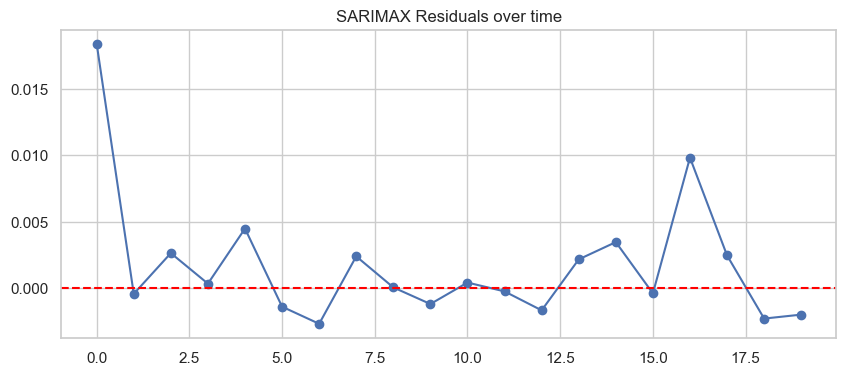

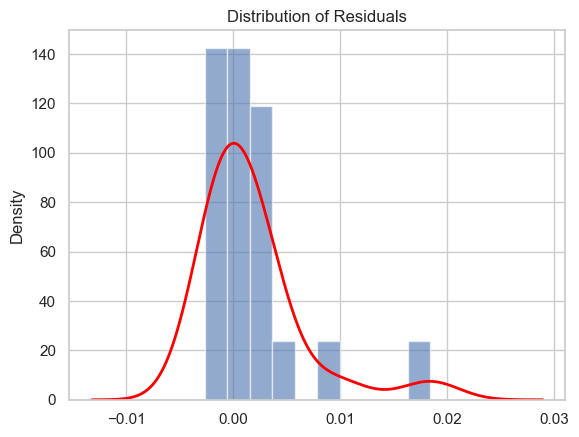

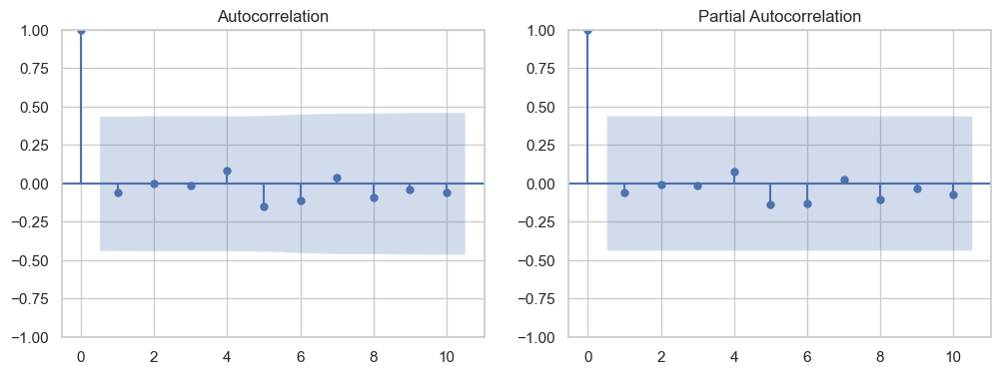

Shapiro-Wilk p-value: 0.00010493384036812721
    lb_stat  lb_pvalue
5  0.908804   0.969581


In [52]:
# calculate residuals
resid = results.resid 

# 1) Residuen plotten
plt.figure(figsize=(10,4))
plt.plot(resid, marker="o")
plt.axhline(0, color="red", linestyle="--")
plt.title("SARIMAX Residuals over time")
plt.show()

# 2) Histogramm + Kernel Density of resudials
resid.plot(kind='hist', bins=10, density=True, alpha=0.6)
resid.plot(kind='kde', lw=2, color="red")
plt.title("Distribution of Residuals")
plt.show()

# 3) ACF/PACF of residuals
fig, ax = plt.subplots(1,2, figsize=(12,4))
sm.graphics.tsa.plot_acf(resid, lags=10, ax=ax[0])
sm.graphics.tsa.plot_pacf(resid, lags=10, ax=ax[1])
plt.show()

# 4) Normality test (Shapiro Wilks)
from scipy.stats import shapiro
stat, p = shapiro(resid)
print("Shapiro-Wilk p-value:", p)

# 5) Ljung-Box Test (autokorrelation in residuals)
ljung_box = sm.stats.acorr_ljungbox(resid, lags=[5], return_df=True)
print(ljung_box)


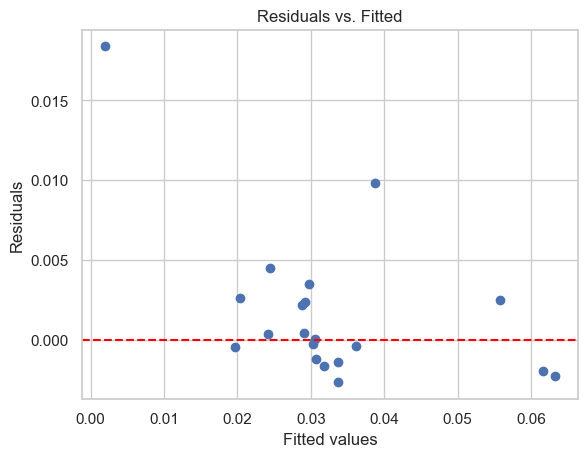

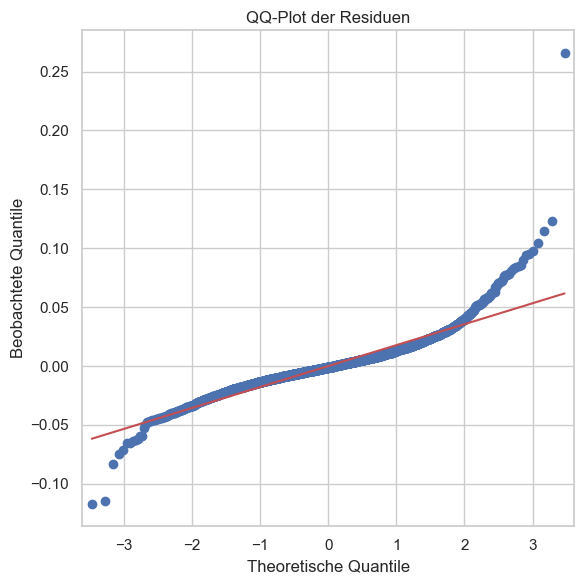

In [53]:
## Scaterplot of fitted vs residuals
plt.scatter(results.fittedvalues, results.resid)
plt.axhline(0, color="red", linestyle="--")
plt.xlabel("Fitted values")
plt.ylabel("Residuals")
plt.title("Residuals vs. Fitted")
plt.show()

## Q-Q Plot of residuals
plt.figure(figsize=(6,6))
sm.qqplot(residuals, line='s', ax=plt.gca())
plt.title("QQ-Plot der Residuen")
plt.xlabel("Theoretische Quantile")
plt.ylabel("Beobachtete Quantile")
plt.tight_layout()
plt.show()

#### 4. Heatmap Comparisons and Visualisations

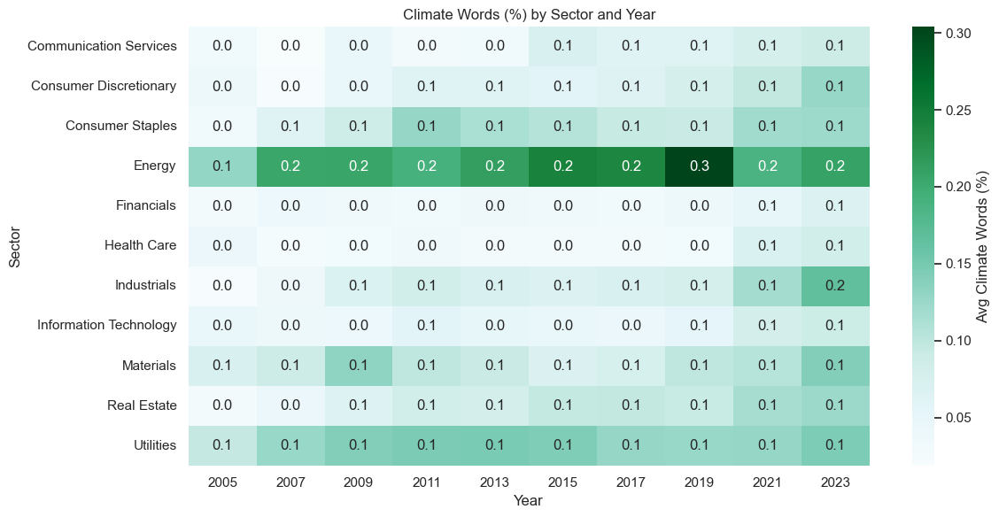

In [54]:
## 1. Heatmap of climate disclosure for sectors over years
# Mean value per Ssectorektor and year
heatmap_data = data.groupby(['FiscalYearEnd', 'sector']).agg({
    'climate_words_normalized': 'mean'}).reset_index()

heatmap_data["climate_percent"]=heatmap_data["climate_words_normalized"]*100

#only use 2 year jumps for better visuality
selected_years = list(range(2005, data['FiscalYearEnd'].max()+1, 2))
heatmap_data = heatmap_data[heatmap_data['FiscalYearEnd'].isin(selected_years)]

#values displayed in percent
pivot_percent = heatmap_data.pivot(index='sector', columns='FiscalYearEnd', values='climate_percent')

# Plot
plt.figure(figsize=(12, 6))
sns.heatmap(pivot_percent, cmap="BuGn", annot=True, fmt=".1f", cbar_kws={'label': 'Avg Climate Words (%)'})
plt.title("Climate Words (%) by Sector and Year")
plt.ylabel("Sector")
plt.xlabel("Year")
plt.tight_layout()
plt.show()


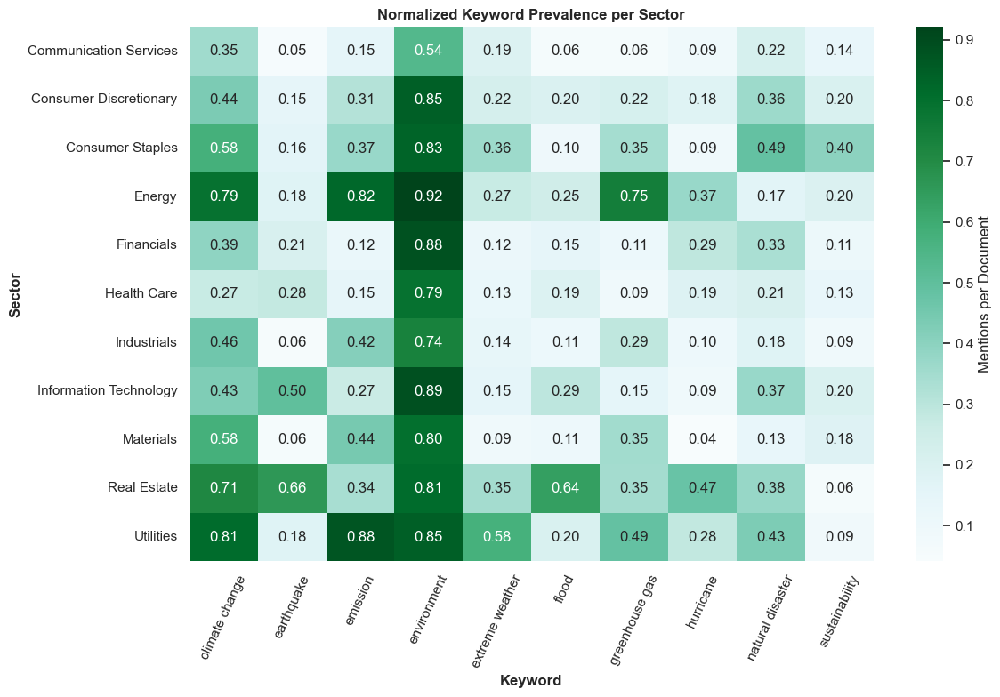

In [55]:
## 2. Heatmap for top absolute climate words
# create words list
data["climate_words_list"] = data["climate_words"].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

df_kw = data.explode("climate_words_list")

# find top 10 occuring words
top_terms_overall = df_kw["climate_words_list"].value_counts().nlargest(10).index.tolist()

sector_kw = df_kw[df_kw["climate_words_list"].isin(top_terms_overall)]

# build pivot
sector_pivot = sector_kw.groupby(["sector","climate_words_list"]).size().unstack(fill_value=0)

# Normalize per sector
docs_per_sector = data.groupby("sector").size()
sector_pivot_norm = sector_pivot.div(docs_per_sector, axis=0).fillna(0)

plt.figure(figsize=(12,8))
sns.heatmap(sector_pivot_norm, annot=True, fmt=".2f", cmap="BuGn", cbar_kws={'label': 'Mentions per Document'})
plt.title("Normalized Keyword Prevalence per Sector", fontweight="bold")
plt.ylabel("Sector", fontweight="semibold")
plt.xlabel("Keyword", fontweight="semibold")
plt.xticks(rotation=65)
plt.tight_layout()
plt.show()

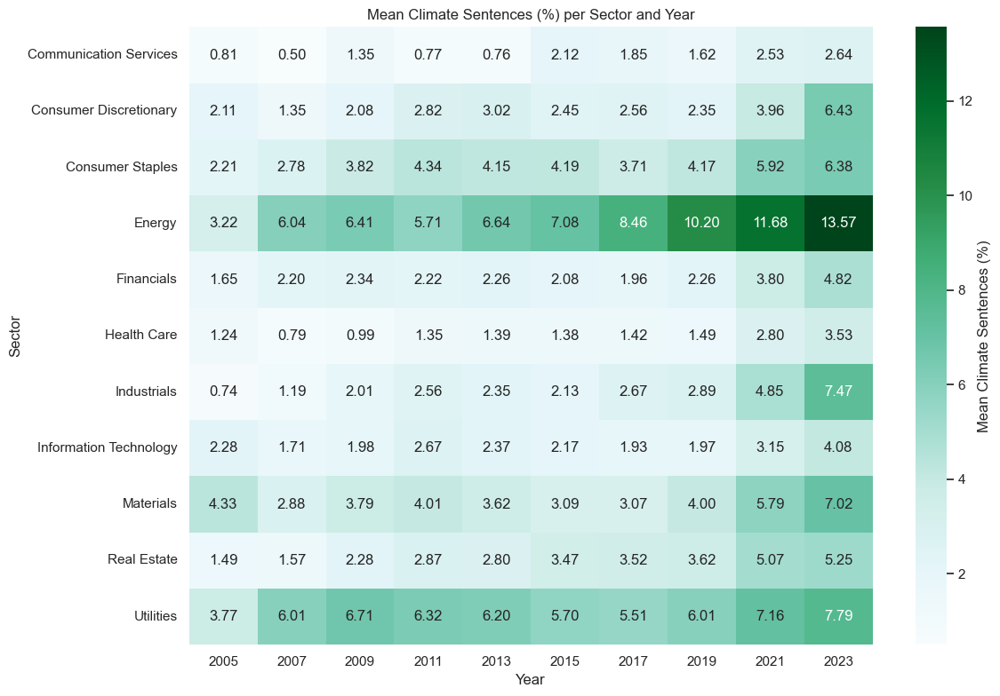

In [56]:
## 3. aggregate mean per year and sector
heatmap_data = data.groupby(['FiscalYearEnd', 'sector']).agg({
    'climate_sentences_normalized': 'mean'}).reset_index()

heatmap_data["climate_percent"]=heatmap_data["climate_sentences_normalized"]*100

#only use 2 year jumps for better visuality
selected_years = list(range(2005, data['FiscalYearEnd'].max()+1, 2))
heatmap_data = heatmap_data[heatmap_data['FiscalYearEnd'].isin(selected_years)]

#values displayed in percent
pivot_percent = heatmap_data.pivot(index='sector', columns='FiscalYearEnd', values='climate_percent')

# Plot
plt.figure(figsize=(12,8))
sns.heatmap(pivot_percent, annot=True, fmt=".2f", cmap="BuGn", cbar_kws={'label': 'Mean Climate Sentences (%)'})
plt.title("Mean Climate Sentences (%) per Sector and Year")
plt.ylabel("Sector")
plt.xlabel("Year")
plt.tight_layout()
plt.show()


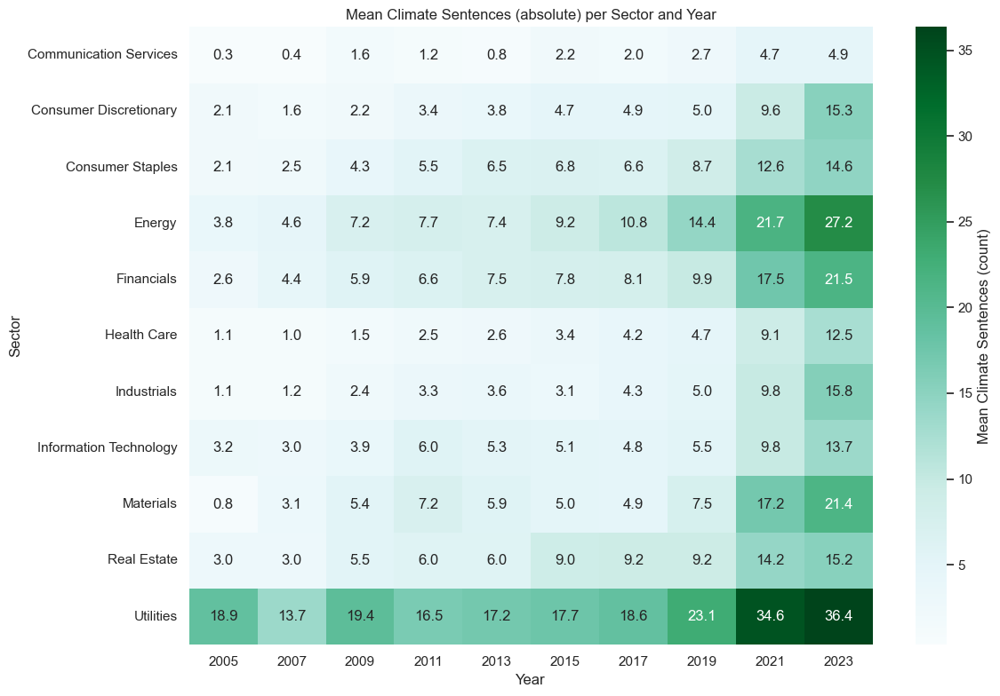

In [57]:
## 5. aggregate mean per year and sector (absolute counts)
heatmap_data = data.groupby(['FiscalYearEnd', 'sector']).agg({
    'climate_sentences_count': 'mean'}).reset_index()

#restrict years for 2 year jumps
selected_years = list(range(2005, data['FiscalYearEnd'].max()+1, 2))
heatmap_data = heatmap_data[heatmap_data['FiscalYearEnd'].isin(selected_years)]

#absolute count of climate related sentences 
pivot_counts = heatmap_data.pivot(index='sector', columns='FiscalYearEnd', values='climate_sentences_count')

# Plot
plt.figure(figsize=(12,8))
sns.heatmap(pivot_counts, annot=True, fmt=".1f", cmap="BuGn", cbar_kws={'label': 'Mean Climate Sentences (count)'})
plt.title("Mean Climate Sentences (absolute) per Sector and Year")
plt.ylabel("Sector")
plt.xlabel("Year")
plt.tight_layout()
plt.show()
